In [1]:
import sys
import os

# Add particle_detection to sys.path
sys.path.append(os.path.abspath(".."))

In [2]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageFilter

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import models
from torchvision.models import ResNet18_Weights

from particle_detection.data.dataset import create_dataloaders
from particle_detection.autoencoder.model import create_autoencoder
from particle_detection.autoencoder.utils import load_model

In [3]:
data_dir = "/home/blah-buttery/nanoparticles/images/normal"
# dataset_dir = "/Users/blah_m4/Desktop/nanoparticle/images" # macbook image location
image_size = (1024, 1024)
batch_size = 8

train_loader, test_loader = create_dataloaders(data_dir=data_dir, image_size=image_size, batch_size=batch_size)

In [4]:
# Path to the trained model
model_path = "../saved_models/ae_1000_epochs.pth"

# Set the device (GPU or CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Create and load the model
autoencoder = create_autoencoder().to(device)
autoencoder = load_model(autoencoder, model_path, device=device)
autoencoder.eval()  # Set the model to evaluation mode

print("Model loaded successfully.")

[DEBUG] Loading model from: ../saved_models/ae_1000_epochs.pth
[DEBUG] Model loaded successfully from ../saved_models/ae_1000_epochs.pth.
Model loaded successfully.


In [5]:
# get the latent space by passing dataset through encoder
with torch.no_grad():
    sample_img = next(iter(test_loader))
    sample_img = sample_img.to(device)
    latent_space = autoencoder.encoder(sample_img)
    print(f"Shape of latent space: {latent_space.shape}")

Shape of latent space: torch.Size([3, 512, 64, 64])


In [6]:
latent_space_reshaped = latent_space.permute(0, 2, 3, 1).reshape(-1, latent_space.shape[1])  # Shape: [N, C]
print(f"Shape of reshaped latent space: {latent_space_reshaped.shape}")

Shape of reshaped latent space: torch.Size([12288, 512])


In [7]:
from sklearn.mixture import GaussianMixture

# apply initial gmm clustering
gmm = GaussianMixture(n_components=5, random_state=42, covariance_type="full")
gmm.fit(latent_space_reshaped.cpu().numpy())
cluster_labels = gmm.predict(latent_space_reshaped.cpu().numpy())

In [8]:
# Map Cluster Labels Back to Spatial Grid
grid_cols = latent_space.shape[3]  # 1024 / 8 = 128
grid_rows = latent_space.shape[2]  # 1024 / 8 = 128
cluster_labels_grid = cluster_labels.reshape(latent_space.shape[0], grid_rows, grid_cols)  # Shape: [B, H, W]

print(f"Cluster labels grid shape: {cluster_labels_grid.shape}")

Cluster labels grid shape: (3, 64, 64)


In [9]:
def visualize_clusters_on_image(image_batch, cluster_labels_grid):
    """
    Visualize clusters directly on the spatial grid of the image.
    
    Args:
        image_batch (torch.Tensor): Batch of images, shape [B, C, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels, shape [B, H, W].
    
    Returns:
        None
    """
    # Select the first image and its cluster labels
    single_image = image_batch[0]  # Shape: [C, H, W]
    single_cluster_labels = cluster_labels_grid[0]  # Shape: [H, W]

    # Visualize the image and clusters
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 2, 1)
    image_np = single_image.cpu().numpy().transpose(1, 2, 0)  # Convert CHW to HWC
    if image_np.max() > 1.0:
        image_np = image_np / 255.0  # Normalize
    plt.imshow(image_np, cmap="gray")
    plt.title("Original Image")
    plt.axis("off")

    # Cluster Overlay
    plt.subplot(1, 2, 2)
    plt.imshow(single_cluster_labels, cmap="viridis")
    plt.title("Cluster Visualization")
    plt.colorbar(label="Cluster")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

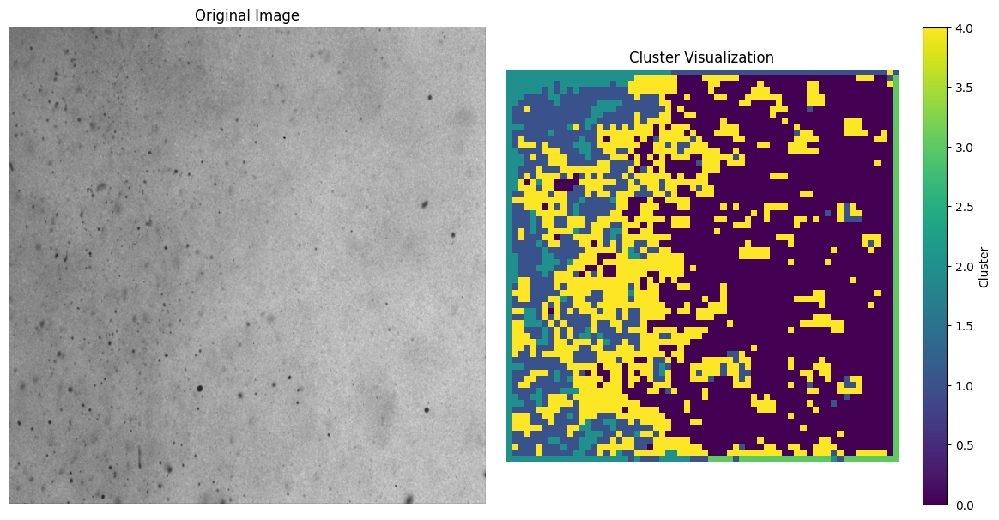

In [10]:
visualize_clusters_on_image(sample_img, cluster_labels_grid)

In [11]:
# okay, but can we improve the results?
# we can do this if we elimante some of the least important channels of the latent space
from sklearn.decomposition import PCA

# Convert PyTorch tensor to NumPy array
latent_space_np = latent_space_reshaped.cpu().numpy()  # Shape: [8192, 512]

# Apply PCA
n_components = 50  # Adjust based on your needs (e.g., explained variance)
pca = PCA(n_components=n_components)
latent_space_pca = pca.fit_transform(latent_space_np)  # Shape: [8192, 50]

print(f"Shape after PCA: {latent_space_pca.shape}")

Shape after PCA: (12288, 50)


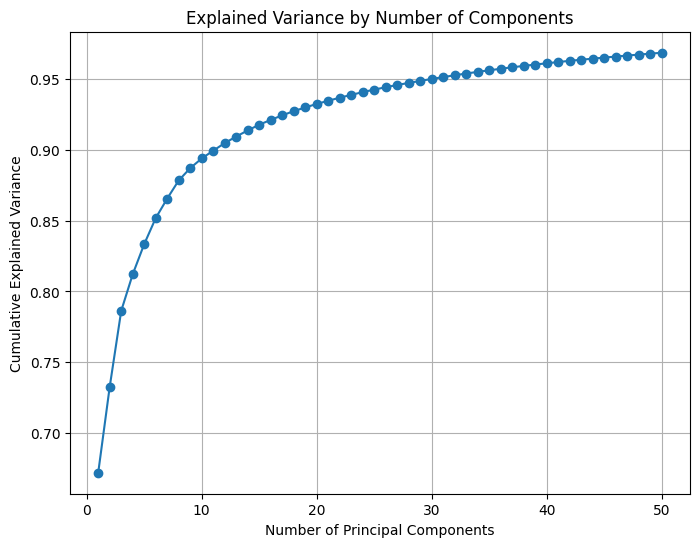

In [12]:
# Plot the explained variance
explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Explained Variance by Number of Components")
plt.grid()
plt.show()

In [13]:
pca = PCA(n_components=40)
latent_space_pca = pca.fit_transform(latent_space_np)  # Shape: [8192, 20]
print(f"Shape after PCA: {latent_space_pca.shape}")

Shape after PCA: (12288, 40)


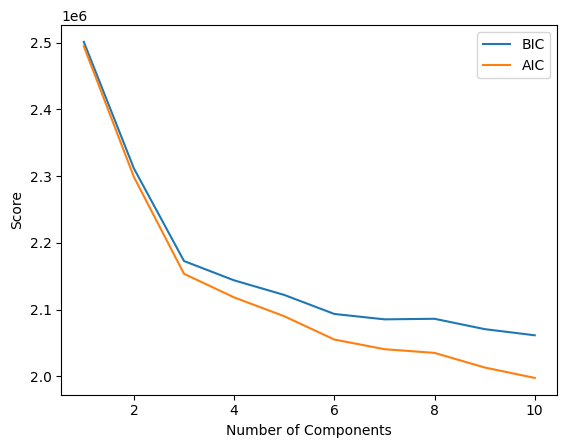

In [14]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

n_components_range = range(1, 11)
bic = []
aic = []

for n in n_components_range:
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm.fit(latent_space_pca)  # Replace 'data' with your dataset
    bic.append(gmm.bic(latent_space_pca))
    aic.append(gmm.aic(latent_space_pca))

plt.plot(n_components_range, bic, label="BIC")
plt.plot(n_components_range, aic, label="AIC")
plt.xlabel("Number of Components")
plt.ylabel("Score")
plt.legend()
plt.show()


In [15]:
gmm = GaussianMixture(n_components=2, random_state=42, covariance_type="full")
gmm.fit(latent_space_pca)  # Fit on reshaped latent space
cluster_labels = gmm.predict(latent_space_pca)  # Shape: [N]

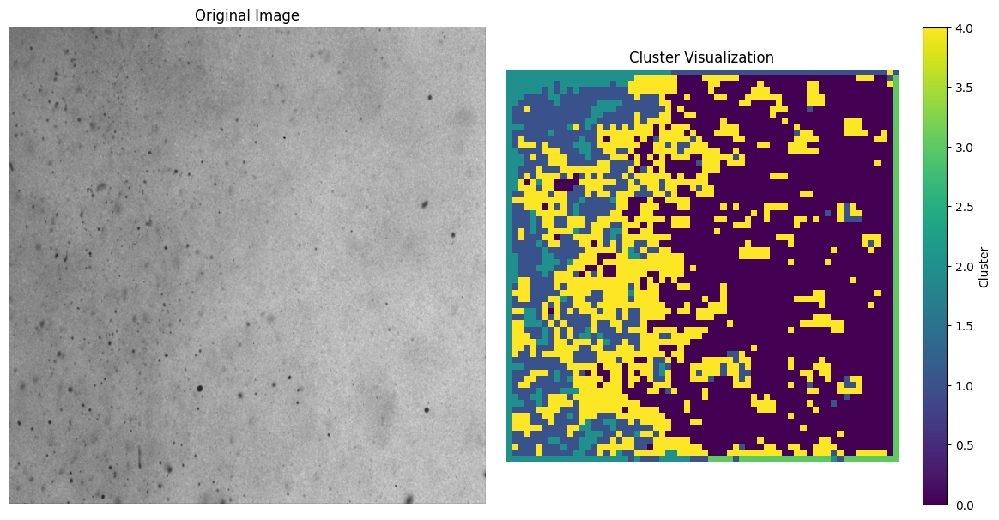

In [16]:
visualize_clusters_on_image(sample_img, cluster_labels_grid)

Unique cluster labels: [0 1 2 3 4]


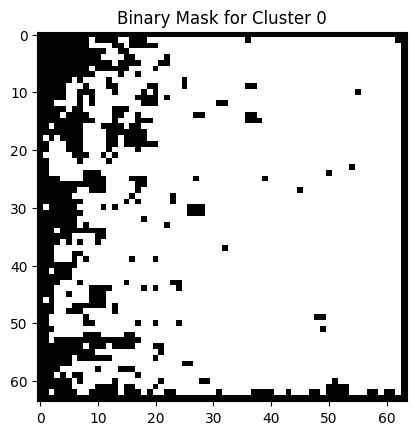

Cluster 0: Found 9 contours.


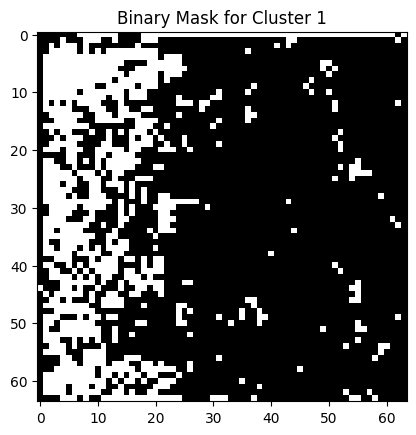

Cluster 1: Found 63 contours.


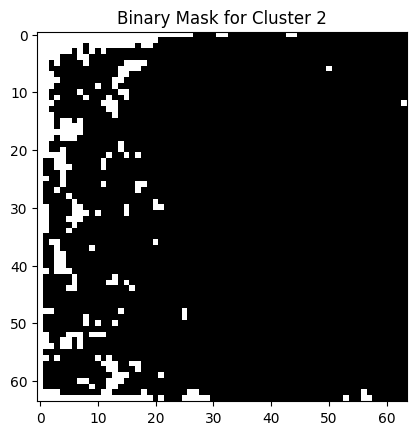

Cluster 2: Found 38 contours.


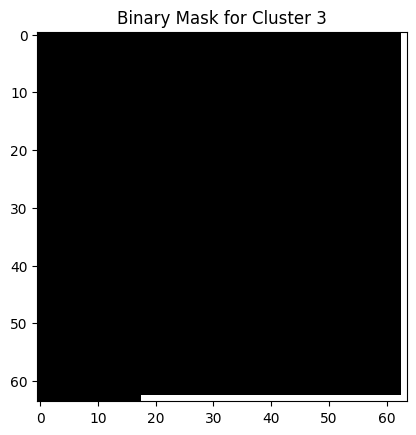

Cluster 3: Found 1 contours.


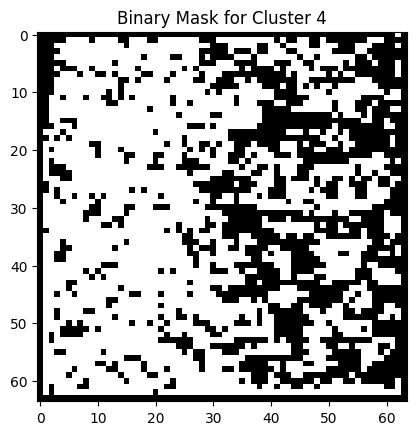

Cluster 4: Found 28 contours.


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

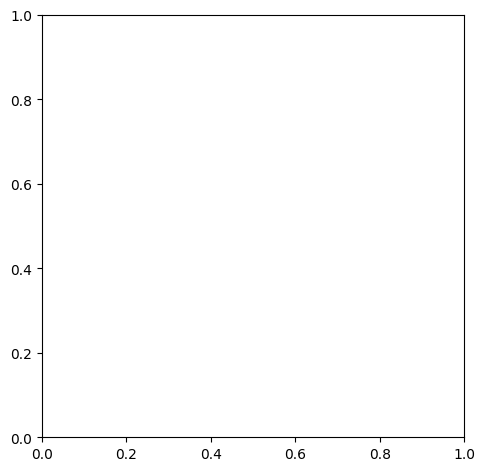

In [17]:
# Debug: Check cluster labels
print(f"Unique cluster labels: {np.unique(cluster_labels_grid)}")

image_np = sample_img[0].cpu().numpy().transpose(1, 2, 0)
visualized_img = image_np.copy()  # Create a copy for visualization

# Iterate over unique clusters
for cluster in np.unique(cluster_labels_grid):
    # Create a binary mask for the current cluster
    cluster_mask = (cluster_labels_grid == cluster).astype(np.uint8)
    
    if cluster_mask.ndim == 3:
        cluster_mask = np.sum(cluster_mask, axis=0)
    cluster_mask = (cluster_mask > 0).astype(np.uint8)
    
    # Debug: Visualize the binary mask
    plt.imshow(cluster_mask, cmap='gray')
    plt.title(f"Binary Mask for Cluster {cluster}")
    plt.show()

    # Find contours
    contours, _ = cv2.findContours(cluster_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    print(f"Cluster {cluster}: Found {len(contours)} contours.")

    # Draw the contours on the visualization image
    cv2.drawContours(visualized_img, contours, -1, (255, 0, 0), 2)

# Visualize results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(sample_img, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(visualized_img, cmap='gray')
plt.title("Particles Visualized")
plt.axis("off")

plt.tight_layout()
plt.show()

In [18]:
def visualize_single_cluster(sample_img, cluster_labels_grid, cluster_to_visualize, scale_factor=16):
    """
    Visualizes a single cluster on a grayscale image.

    Args:
        sample_img (torch.Tensor): The grayscale image tensor of shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): The cluster labels grid of shape [B, H, W].
        cluster_to_visualize (int): The specific cluster to visualize.
        scale_factor (int): Scaling factor to map latent space coordinates to original image coordinates.
    
    Returns:
        None: Displays the image with the selected cluster highlighted.
    """
    print(f"Processing cluster: {cluster_to_visualize}")
    
    # Convert `sample_img` to NumPy for visualization
    image_np = sample_img[0, 0].cpu().numpy()  # Convert to 2D array (H, W)
    image_with_cluster = np.stack([image_np] * 3, axis=-1)  # Convert grayscale to RGB for visualization
    
    # Extract all coordinates for the specified cluster
    coords = np.argwhere(cluster_labels_grid[0] == cluster_to_visualize)  # Get coordinates (row, col)
    print(f"Cluster {cluster_to_visualize}: {len(coords)} points found.")
    
    # Map the coordinates to the original image dimensions
    for coord in coords:
        y, x = coord * scale_factor  # Scale to original dimensions
        # Draw a small rectangle (just around the coordinate)
        cv2.rectangle(
            image_with_cluster,
            (x, y),
            (x + 1, y + 1),  # A box of size 1x1 pixel
            (255, 0, 0),  # Red color in BGR (converted to RGB)
            thickness=1  # Thickness of the rectangle
        )
    
    # Visualize the Image with Highlighted Cluster
    plt.figure(figsize=(12, 12))
    plt.imshow(image_with_cluster, cmap="gray")
    plt.title(f"Cluster {cluster_to_visualize} Highlighted")
    plt.axis("off")
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


Processing cluster: 1
Cluster 1: 697 points found.


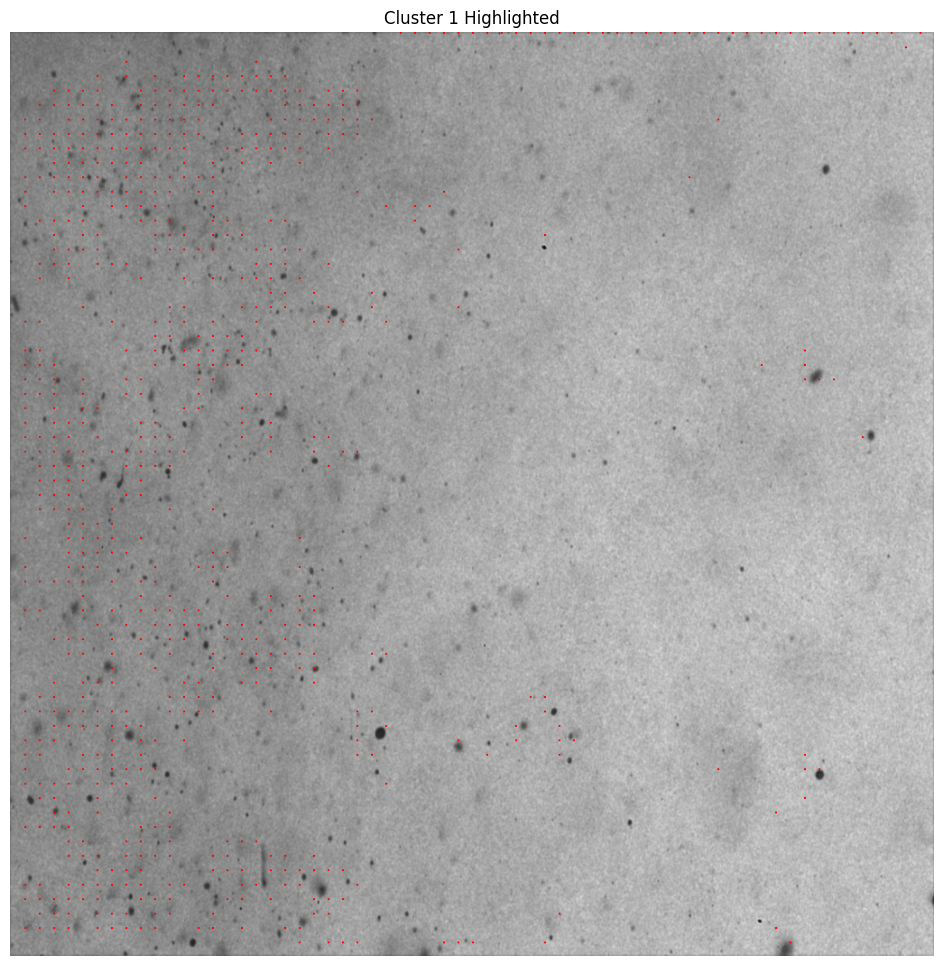

In [20]:
cluster_to_visualize = 1  # Specify the cluster you want to visualize
visualize_single_cluster(sample_img, cluster_labels_grid, cluster_to_visualize, scale_factor=16)

In [21]:
def visualize_clusters_with_contours(sample_img, cluster_labels_grid, scale_factor=16):
    """
    Visualize clusters with contours overlaid on the original image.

    Args:
        sample_img (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        scale_factor (int): Scaling factor to map latent space to original dimensions.

    Returns:
        None: Displays the image with contours for each cluster.
    """
    # Convert the image to NumPy
    image_np = sample_img[0, 0].cpu().numpy()  # Shape: [H, W]
    original_h, original_w = image_np.shape

    # Upscale the image to match the original size
    image_resized = cv2.resize(
        image_np, (original_w, original_h), interpolation=cv2.INTER_LINEAR
    )
    image_colored = cv2.cvtColor(image_resized, cv2.COLOR_GRAY2BGR)  # Convert to RGB

    # Upscale the cluster labels to match the original image size
    cluster_labels_resized = cv2.resize(
        cluster_labels_grid[0],  # Use the first image in the batch
        (original_w, original_h),
        interpolation=cv2.INTER_NEAREST,
    )

    # Debugging: Verify the dimensions of the resized cluster labels
    print(f"Original image size: {original_h}x{original_w}")
    print(f"Resized cluster labels size: {cluster_labels_resized.shape}")

    # Loop through each unique cluster and draw its contours
    unique_clusters = np.unique(cluster_labels_resized)
    print(f"Unique clusters found: {unique_clusters}")

    for cluster_id in unique_clusters:
        # Create a binary mask for the current cluster
        mask = (cluster_labels_resized == cluster_id).astype(np.uint8)

        # Find contours for the current cluster
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Draw contours on the image
        color = tuple(np.random.randint(0, 255, size=3).tolist())  # Random color
        cv2.drawContours(image_colored, contours, -1, color, thickness=2)

    # Visualize the final result
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title("Clusters with Contours")
    plt.axis("off")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.11372549..244.0].


Original image size: 1024x1024
Resized cluster labels size: (1024, 1024)
Unique clusters found: [0 1 2 3 4]


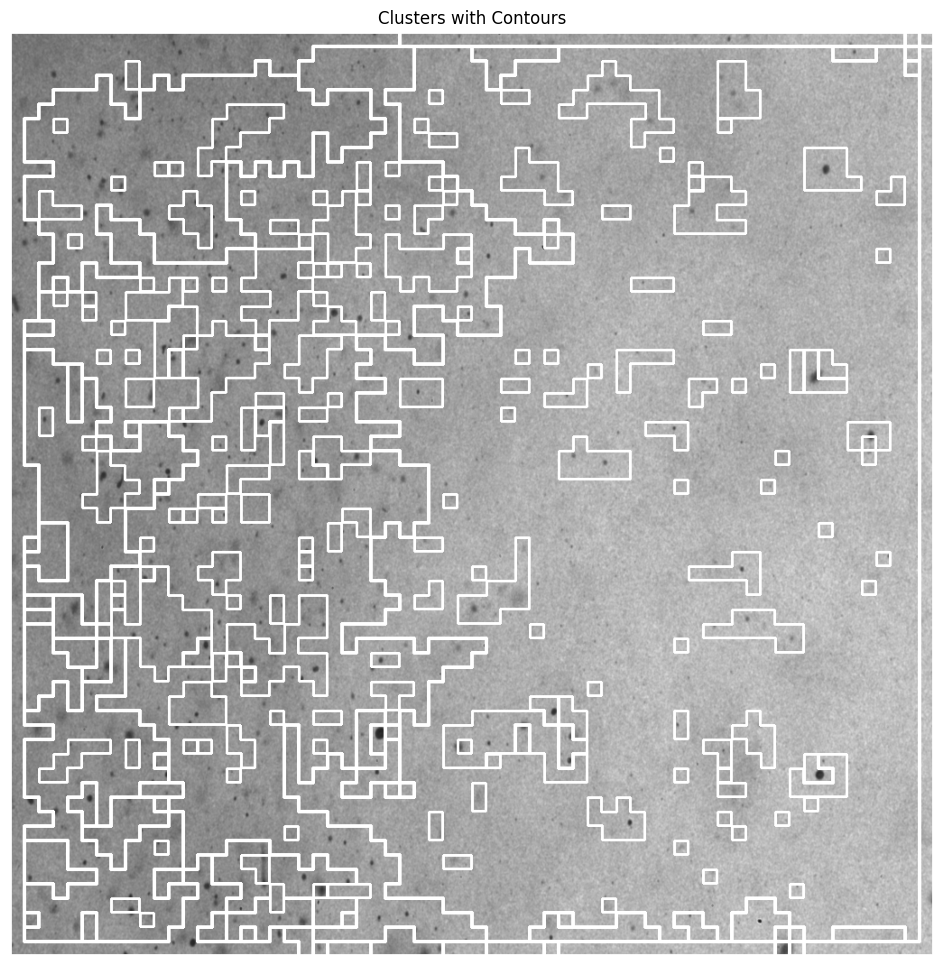

In [22]:
visualize_clusters_with_contours(sample_img, cluster_labels_grid, scale_factor=16)

In [23]:
def visualize_single_cluster_contour(sample_img, cluster_labels_grid, cluster_id_to_display, scale_factor=16):
    """
    Visualize a single cluster with contours overlaid on the original image.

    Args:
        sample_img (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        cluster_id_to_display (int): The specific cluster label to isolate and display.
        scale_factor (int): Scaling factor to map latent space to original dimensions.

    Returns:
        None: Displays the image with contours for the specified cluster.
    """
    # Convert the image to NumPy
    image_np = sample_img[0, 0].cpu().numpy()  # Shape: [H, W]
    original_h, original_w = image_np.shape

    # Upscale the image to match the original size
    image_resized = cv2.resize(
        image_np, (original_w, original_h), interpolation=cv2.INTER_LINEAR
    )
    image_colored = cv2.cvtColor(image_resized, cv2.COLOR_GRAY2BGR)  # Convert to RGB

    # Upscale the cluster labels to match the original image size
    cluster_labels_resized = cv2.resize(
        cluster_labels_grid[0],  # Use the first image in the batch
        (original_w, original_h),
        interpolation=cv2.INTER_NEAREST,
    )

    # Create a binary mask for the specified cluster
    mask = (cluster_labels_resized == cluster_id_to_display).astype(np.uint8)

    # Debugging: Verify the mask
    print(f"Displaying cluster ID: {cluster_id_to_display}")
    print(f"Number of pixels in cluster: {np.sum(mask)}")

    # Find contours for the specified cluster
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours for the cluster
    cv2.drawContours(image_colored, contours, -1, (0, 255, 0), thickness=2)  # Green for contours

    # Visualize the final result
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title(f"Cluster {cluster_id_to_display} with Contours")
    plt.axis("off")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


Displaying cluster ID: 4
Number of pixels in cluster: 279552


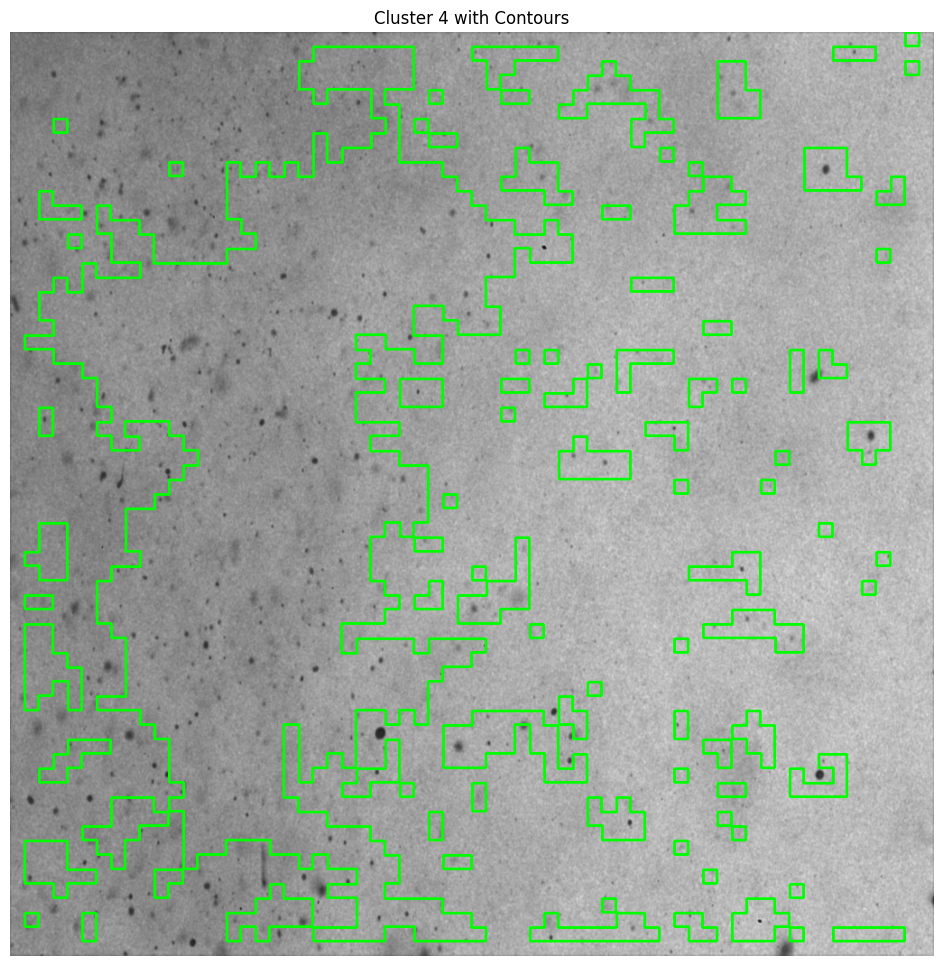

In [25]:
cluster_id = 4

# Call the function
visualize_single_cluster_contour(sample_img, cluster_labels_grid, cluster_id_to_display=cluster_id, scale_factor=16)

In [26]:
def filter_particles_by_size_and_shape(sample_img, cluster_labels_grid, cluster_id_to_display, min_area=10, max_area=500, min_circularity=0.7):
    """
    Filter particles based on size and shape and overlay contours on the image.

    Args:
        sample_img (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        cluster_id_to_display (int): The specific cluster label to isolate and filter.
        min_area (int): Minimum area of a valid particle.
        max_area (int): Maximum area of a valid particle.
        min_circularity (float): Minimum circularity of a valid particle (0 to 1).
    
    Returns:
        None: Displays the filtered particles overlaid on the image.
    """
    # Convert the image to NumPy
    image_np = sample_img[0, 0].cpu().numpy()  # Shape: [H, W]
    original_h, original_w = image_np.shape

    # Upscale the image to match the original size
    image_resized = cv2.resize(
        image_np, (original_w, original_h), interpolation=cv2.INTER_LINEAR
    )
    image_colored = cv2.cvtColor(image_resized, cv2.COLOR_GRAY2BGR)  # Convert to RGB

    # Upscale the cluster labels to match the original image size
    cluster_labels_resized = cv2.resize(
        cluster_labels_grid[0],
        (original_w, original_h),
        interpolation=cv2.INTER_NEAREST,
    )

    # Create a binary mask for the specified cluster
    mask = (cluster_labels_resized == cluster_id_to_display).astype(np.uint8)

    # Find contours for the specified cluster
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours by size and shape
    valid_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if min_area <= area <= max_area:
            # Calculate circularity
            perimeter = cv2.arcLength(contour, True)
            if perimeter == 0:
                continue
            circularity = 4 * np.pi * (area / (perimeter ** 2))
            if circularity >= min_circularity:
                valid_contours.append(contour)

    # Debugging: Print the number of valid contours
    print(f"Total contours found: {len(contours)}")
    print(f"Valid particles after filtering: {len(valid_contours)}")

    # Draw valid contours
    cv2.drawContours(image_colored, valid_contours, -1, (0, 255, 0), thickness=2)  # Green for valid contours

    # Visualize the final result
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title(f"Filtered Particles from Cluster {cluster_id_to_display}")
    plt.axis("off")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


Total contours found: 54
Valid particles after filtering: 42


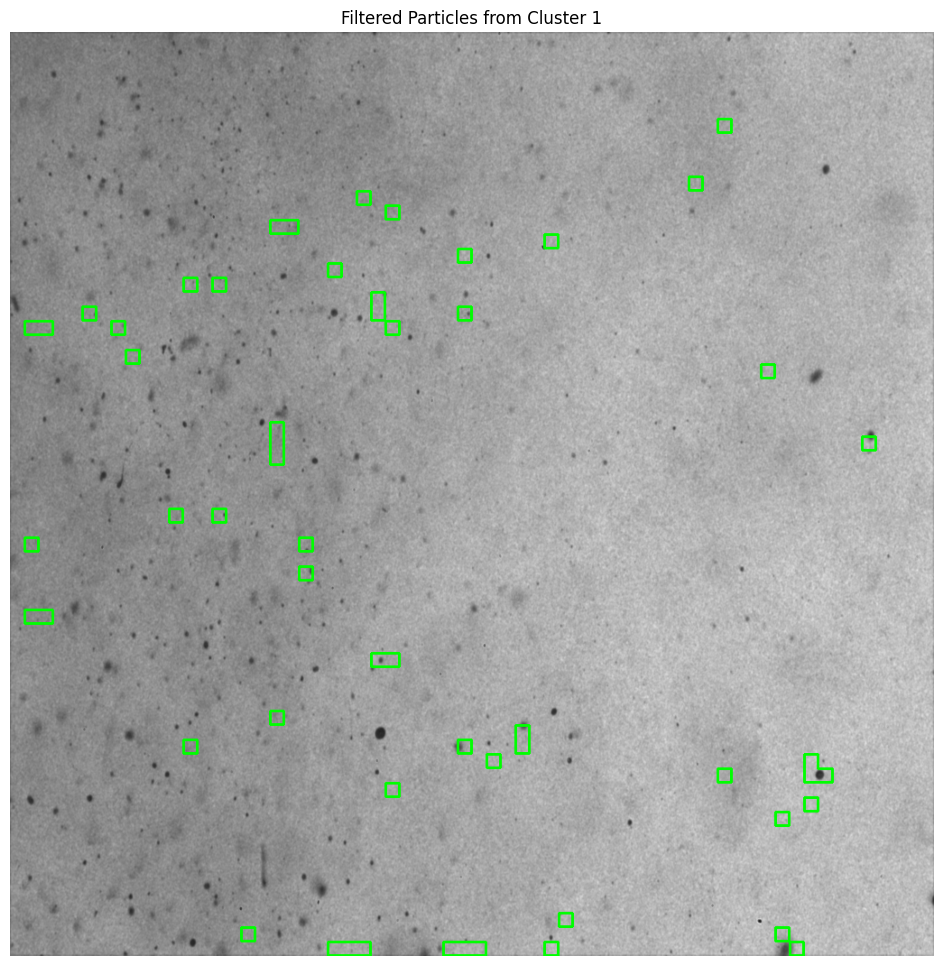

In [28]:
filter_particles_by_size_and_shape(
    sample_img=sample_img,
    cluster_labels_grid=cluster_labels_grid,
    cluster_id_to_display=1,  # Replace with the cluster ID to filter
    min_area=0.1,              # Minimum particle size
    max_area=900,             # Maximum particle size
    min_circularity=0.2       # Minimum circularity (close to 1 for near-circles)
)

In [29]:
def display_all_clusters_and_filter_by_size(
    sample_img, cluster_labels_grid, min_area=10, max_area=500
):
    """
    Display all clusters and then apply size-based filtering to isolate particles.

    Args:
        sample_img (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        min_area (int): Minimum area of a valid particle.
        max_area (int): Maximum area of a valid particle.

    Returns:
        None: Displays the image with all clusters and filtered particles.
    """
    # Convert the image to NumPy
    image_np = sample_img[0, 0].cpu().numpy()  # Shape: [H, W]
    original_h, original_w = image_np.shape

    # Upscale the image to match the original size
    image_resized = cv2.resize(
        image_np, (original_w, original_h), interpolation=cv2.INTER_LINEAR
    )
    image_colored = cv2.cvtColor(image_resized, cv2.COLOR_GRAY2BGR)  # Convert to RGB

    # Upscale the cluster labels to match the original image size
    cluster_labels_resized = cv2.resize(
        cluster_labels_grid[0],
        (original_w, original_h),
        interpolation=cv2.INTER_NEAREST,
    )

    # Create a binary mask for all clusters
    unique_clusters = np.unique(cluster_labels_resized)
    all_contours = []
    for cluster_id in unique_clusters:
        mask = (cluster_labels_resized == cluster_id).astype(np.uint8)
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        all_contours.extend(contours)

    # Visualize all clusters
    image_all_clusters = image_colored.copy()
    cv2.drawContours(image_all_clusters, all_contours, -1, (0, 255, 0), thickness=1)  # Green for all contours
    plt.figure(figsize=(12, 12))
    plt.imshow(image_all_clusters)
    plt.title("All Clusters with Contours")
    plt.axis("off")
    plt.show()

    # Apply size filtering
    valid_contours = [
        contour
        for contour in all_contours
        if min_area <= cv2.contourArea(contour) <= max_area
    ]

    # Visualize filtered contours
    image_filtered = image_colored.copy()
    cv2.drawContours(image_filtered, valid_contours, -1, (255, 0, 0), thickness=2)  # Blue for valid contours
    plt.figure(figsize=(12, 12))
    plt.imshow(image_filtered)
    plt.title(f"Filtered Particles (Area: {min_area}-{max_area})")
    plt.axis("off")
    plt.show()

    # Debugging: Print total contours and filtered contours
    print(f"Total contours found: {len(all_contours)}")
    print(f"Valid contours after filtering: {len(valid_contours)}")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


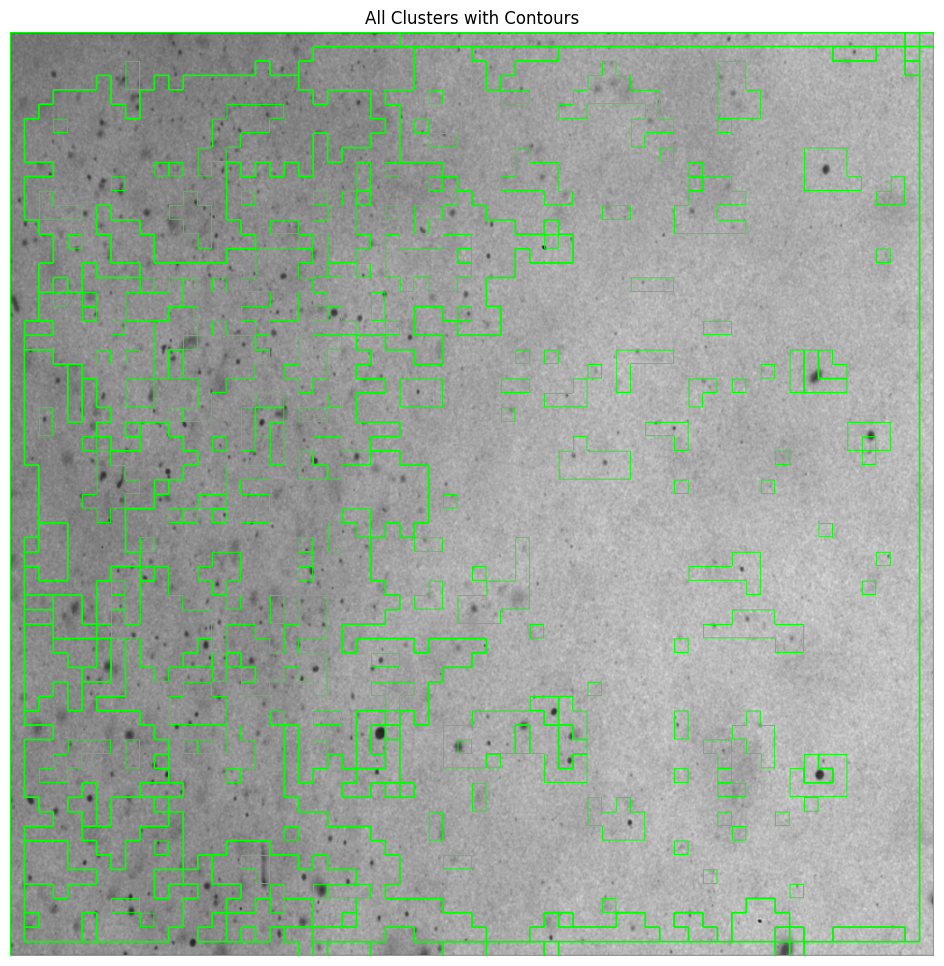

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


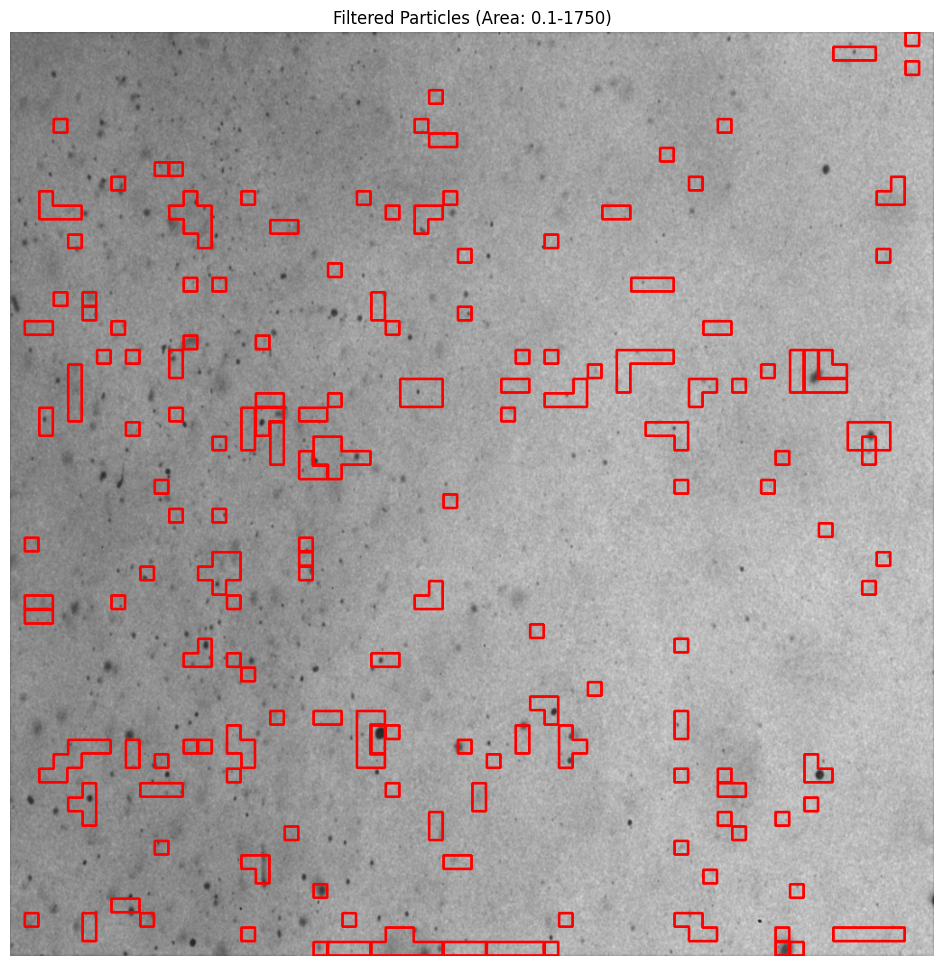

Total contours found: 182
Valid contours after filtering: 145


In [30]:
display_all_clusters_and_filter_by_size(
    sample_img=sample_img,
    cluster_labels_grid=cluster_labels_grid,
    min_area=0.1,    # Adjust to match expected particle size
    max_area=1750,  # Adjust to match expected particle size
)

In [30]:
def mask_image_and_find_contours(original_image, cluster_labels_grid, cluster_ids_to_keep):
    """
    Mask the original image based on cluster labels and find contours in the masked image.

    Args:
        original_image (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        cluster_ids_to_keep (list): List of cluster IDs to keep in the mask.

    Returns:
        None: Displays the masked image and the contours found.
    """
    # Convert the image to NumPy
    image_np = original_image[0, 0].cpu().numpy()  # Shape: [H, W]

    # Create a binary mask for the specified cluster IDs
    mask = np.zeros_like(cluster_labels_grid[0], dtype=np.uint8)
    for cluster_id in cluster_ids_to_keep:
        mask[cluster_labels_grid[0] == cluster_id] = 1

    # Upscale the mask to match the original image size
    mask_resized = cv2.resize(
        mask, (image_np.shape[1], image_np.shape[0]), interpolation=cv2.INTER_NEAREST
    )

    # Apply the mask to the original image
    masked_image = image_np * mask_resized

    # Find contours on the masked image
    contours, _ = cv2.findContours(mask_resized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Visualize the masked image
    plt.figure(figsize=(12, 12))
    plt.imshow(masked_image, cmap="gray")
    plt.title("Masked Image")
    plt.axis("off")
    plt.show()

    # Visualize contours on the masked image
    image_colored = cv2.cvtColor((masked_image * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
    cv2.drawContours(image_colored, contours, -1, (0, 255, 0), thickness=2)
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title("Contours on Masked Image")
    plt.axis("off")
    plt.show()

    print(f"Total contours found: {len(contours)}")

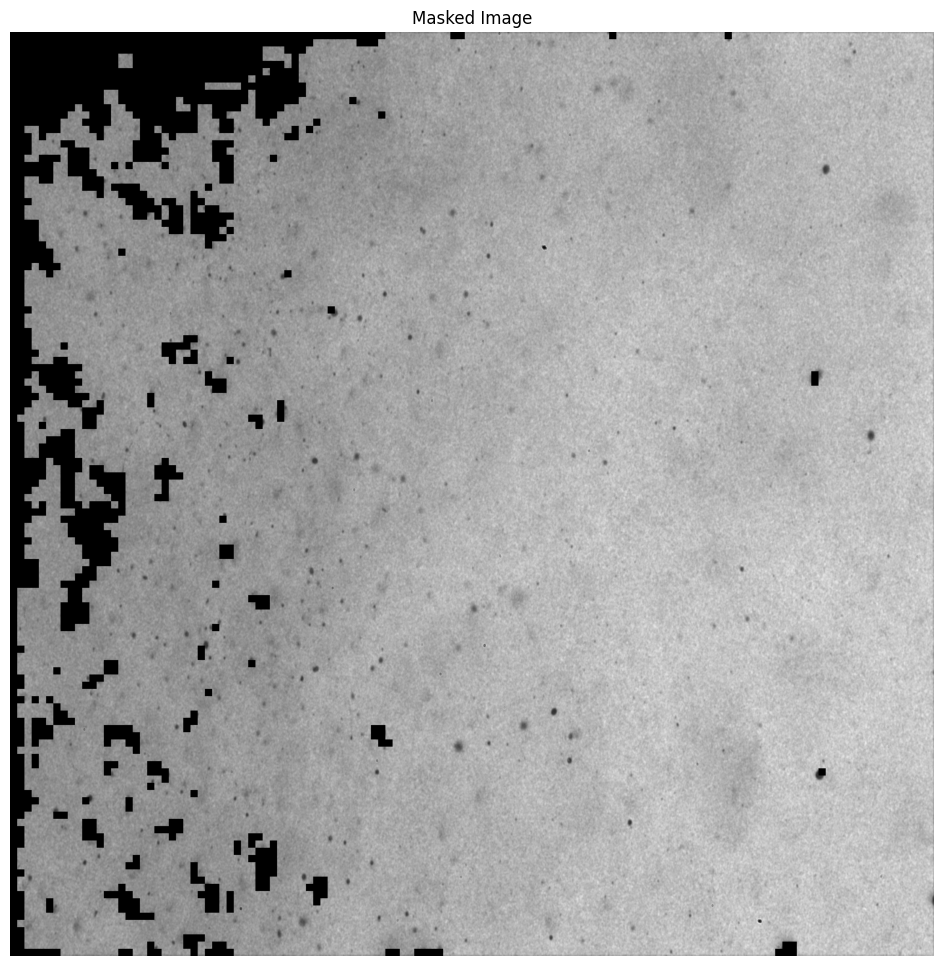

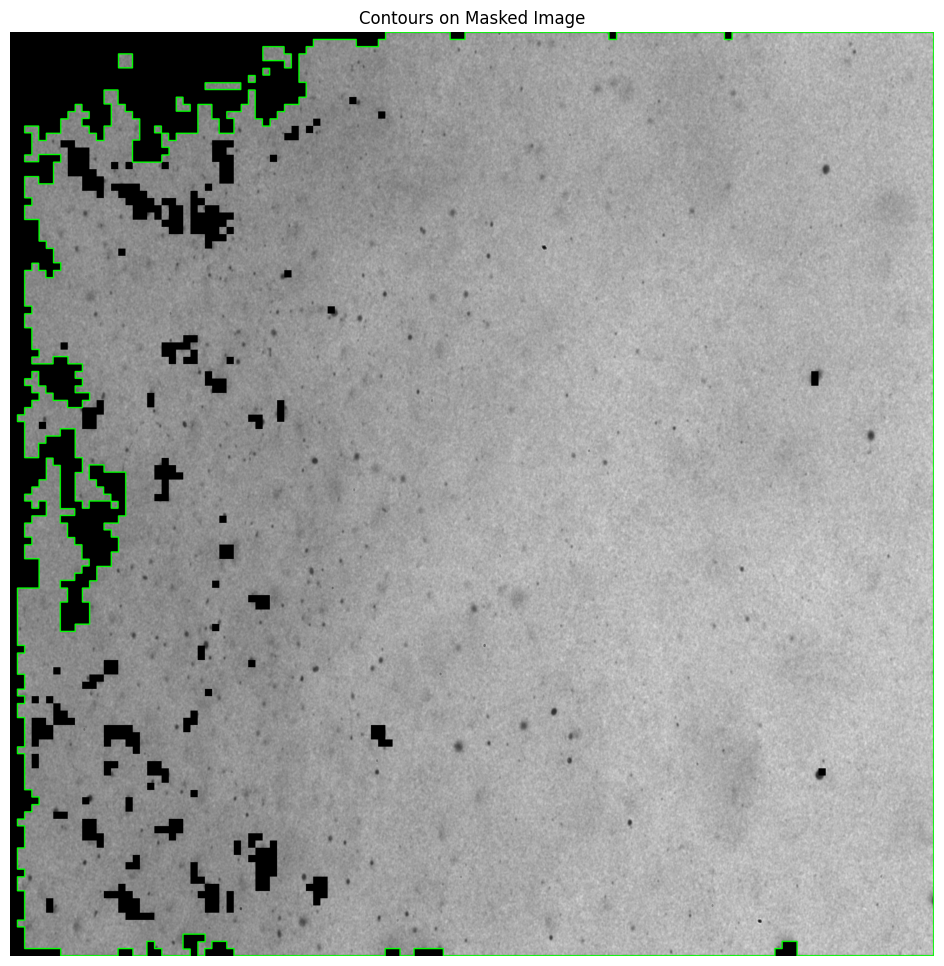

Total contours found: 7


In [33]:
# Specify the cluster IDs to keep (e.g., particles only)
cluster_ids_to_keep = [0, 1, 2, 3]  # Adjust based on your GMM clusters

# Call the function
mask_image_and_find_contours(
    original_image=sample_img,
    cluster_labels_grid=cluster_labels_grid,
    cluster_ids_to_keep=cluster_ids_to_keep
)


In [34]:
def mask_image_and_find_contours_inverted(original_image, cluster_labels_grid, cluster_ids_to_keep):
    """
    Mask the original image by blacking out areas without clusters and find contours.

    Args:
        original_image (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        cluster_ids_to_keep (list): List of cluster IDs to keep in the mask.

    Returns:
        None: Displays the masked image and the contours found.
    """
    # Convert the image to NumPy
    image_np = original_image[0, 0].cpu().numpy()  # Shape: [H, W]

    # Create a binary mask for the specified cluster IDs
    mask = np.zeros_like(cluster_labels_grid[0], dtype=np.uint8)
    for cluster_id in cluster_ids_to_keep:
        mask[cluster_labels_grid[0] == cluster_id] = 1

    # Invert the mask: Set areas without clusters to black
    inverted_mask = (mask == 0).astype(np.uint8)

    # Upscale the mask to match the original image size
    mask_resized = cv2.resize(
        inverted_mask, (image_np.shape[1], image_np.shape[0]), interpolation=cv2.INTER_NEAREST
    )

    # Apply the mask to the original image
    masked_image = image_np * mask_resized

    # Find contours on the masked image
    contours, _ = cv2.findContours(mask_resized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Visualize the masked image
    plt.figure(figsize=(12, 12))
    plt.imshow(masked_image, cmap="gray")
    plt.title("Masked Image (Non-Cluster Areas Blacked Out)")
    plt.axis("off")
    plt.show()

    # Visualize contours on the masked image
    image_colored = cv2.cvtColor((masked_image * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
    cv2.drawContours(image_colored, contours, -1, (0, 255, 0), thickness=2)
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title("Contours on Masked Image")
    plt.axis("off")
    plt.show()

    print(f"Total contours found: {len(contours)}")


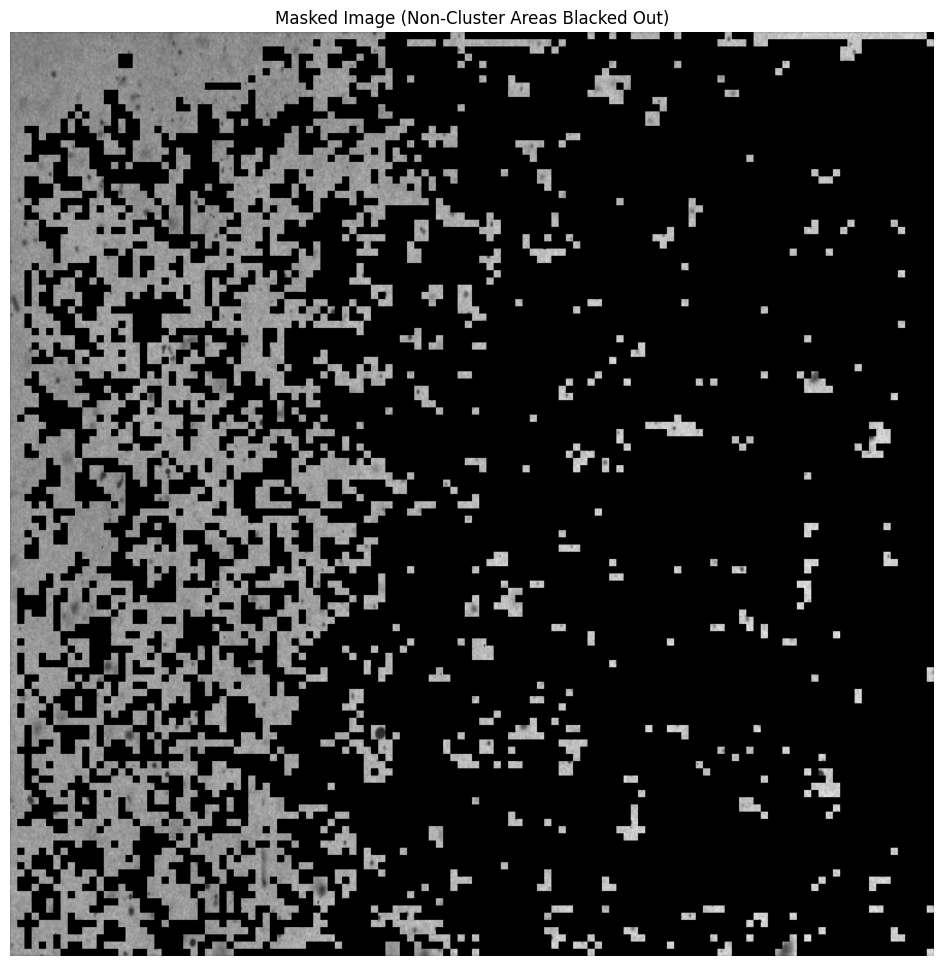

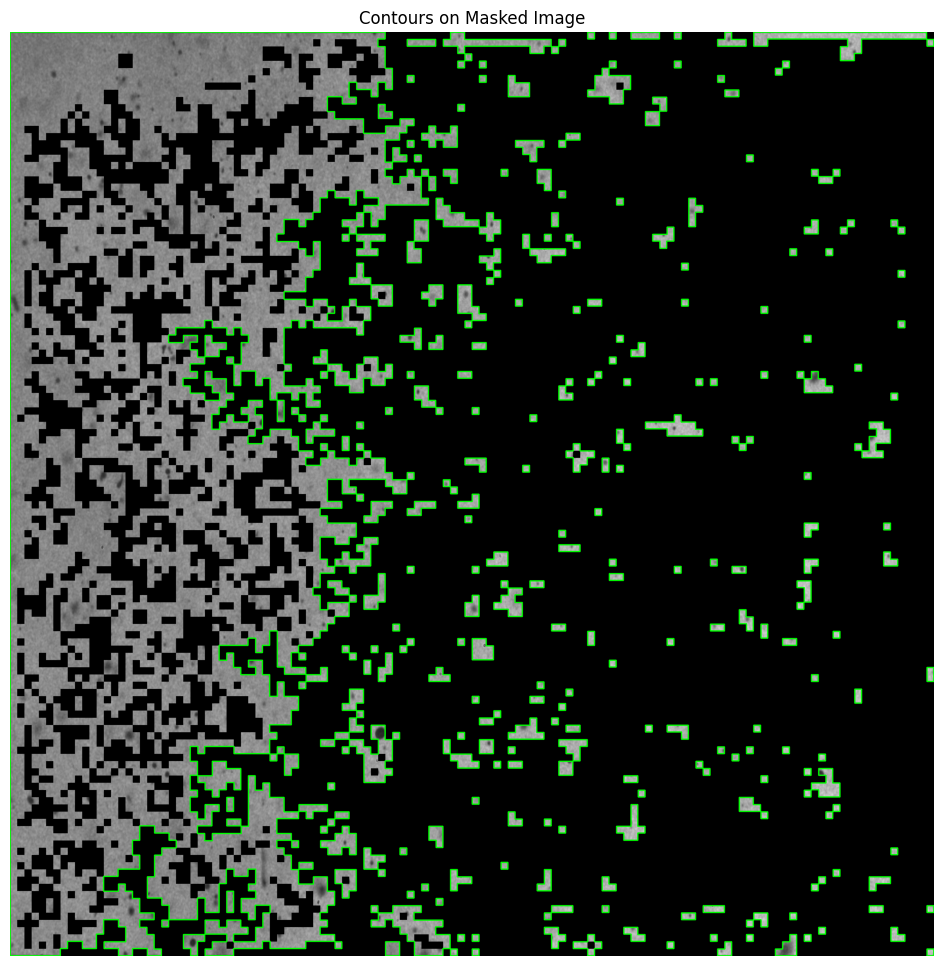

Total contours found: 224


In [35]:
# Specify the cluster IDs to keep (e.g., particles only)
cluster_ids_to_keep = [0, 1, 2]  # Adjust based on your GMM clusters

# Call the function
mask_image_and_find_contours_inverted(
    original_image=sample_img,
    cluster_labels_grid=cluster_labels_grid,
    cluster_ids_to_keep=cluster_ids_to_keep
)


In [20]:
def display_all_clusters_and_filter_by_size(
    sample_img, cluster_labels_grid, min_area=10, max_area=500
):
    """
    Display all clusters and apply size-based filtering to isolate particles.
    Returns the valid contours for further processing.

    Args:
        sample_img (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        min_area (int): Minimum area of a valid particle.
        max_area (int): Maximum area of a valid particle.

    Returns:
        valid_contours (list): List of filtered contours that meet size criteria.
    """
    # Convert the image to NumPy
    image_np = sample_img[0, 0].cpu().numpy()  # Shape: [H, W]
    original_h, original_w = image_np.shape

    # Upscale the image to match the original size
    image_resized = cv2.resize(
        image_np, (original_w, original_h), interpolation=cv2.INTER_LINEAR
    )
    image_colored = cv2.cvtColor(image_resized, cv2.COLOR_GRAY2BGR)  # Convert to RGB

    # Upscale the cluster labels to match the original image size
    cluster_labels_resized = cv2.resize(
        cluster_labels_grid[0],
        (original_w, original_h),
        interpolation=cv2.INTER_NEAREST,
    )

    # Create a binary mask for all clusters
    unique_clusters = np.unique(cluster_labels_resized)
    all_contours = []
    for cluster_id in unique_clusters:
        mask = (cluster_labels_resized == cluster_id).astype(np.uint8)
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        all_contours.extend(contours)

    # Visualize all clusters
    image_all_clusters = image_colored.copy()
    cv2.drawContours(image_all_clusters, all_contours, -1, (0, 255, 0), thickness=1)  # Green for all contours
    plt.figure(figsize=(12, 12))
    plt.imshow(image_all_clusters)
    plt.title("All Clusters with Contours")
    plt.axis("off")
    plt.show()

    # Apply size filtering
    valid_contours = [
        contour
        for contour in all_contours
        if min_area <= cv2.contourArea(contour) <= max_area
    ]

    # Visualize filtered contours
    image_filtered = image_colored.copy()
    cv2.drawContours(image_filtered, valid_contours, -1, (255, 0, 0), thickness=2)  # Blue for valid contours
    plt.figure(figsize=(12, 12))
    plt.imshow(image_filtered)
    plt.title(f"Filtered Particles (Area: {min_area}-{max_area})")
    plt.axis("off")
    plt.show()

    # Debugging: Print total contours and filtered contours
    print(f"Total contours found: {len(all_contours)}")
    print(f"Valid contours after filtering: {len(valid_contours)}")

    # Return the valid contours
    return valid_contours


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


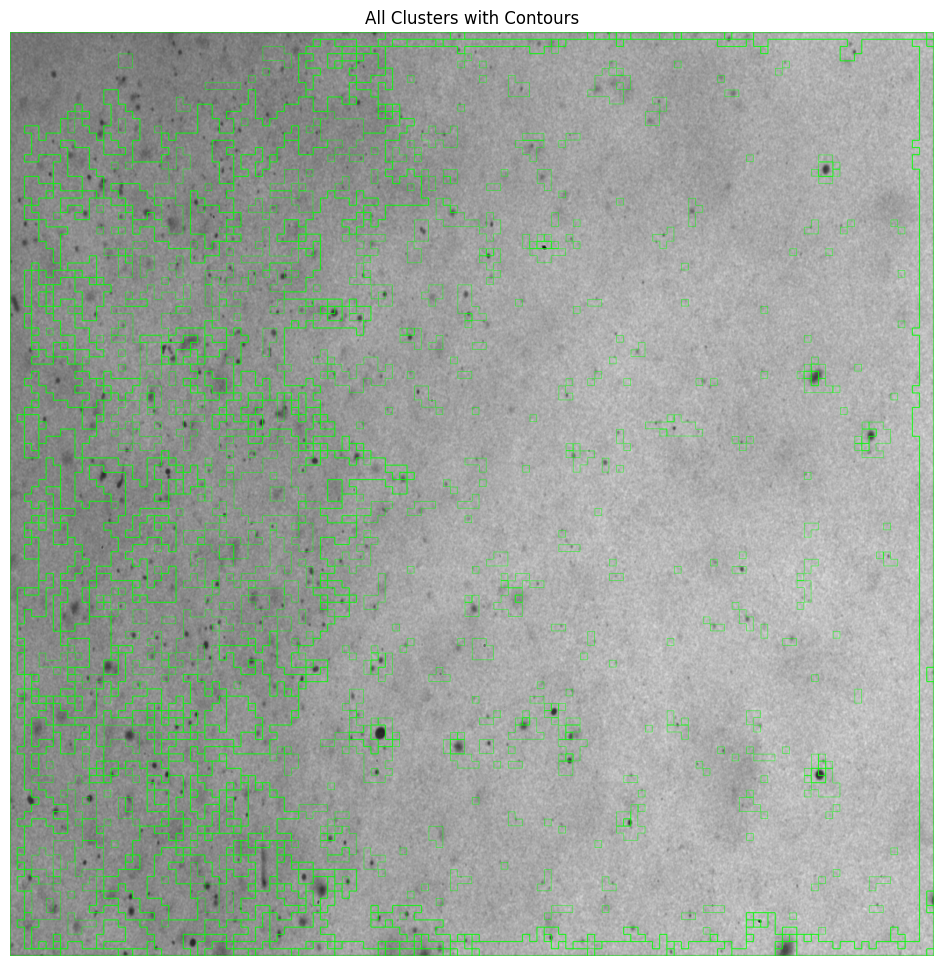

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


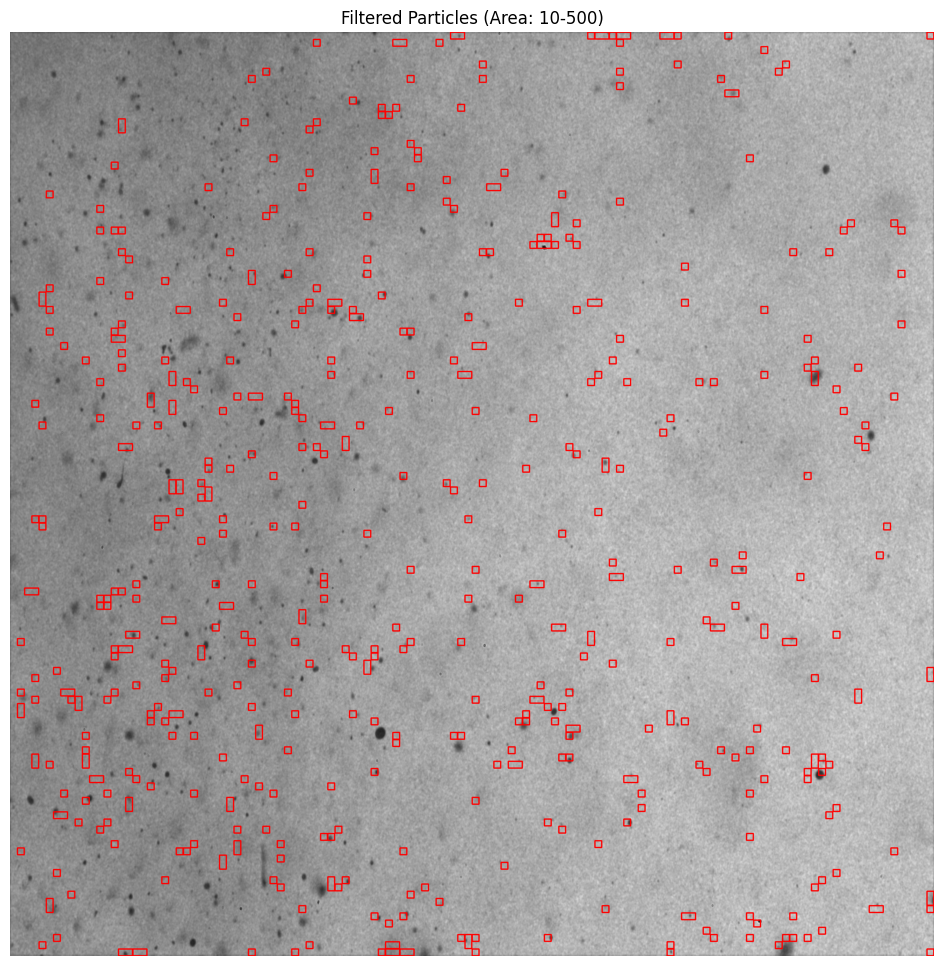

Total contours found: 687
Valid contours after filtering: 426
Number of valid particles: 426


In [38]:
# Call the function to filter contours
valid_contours = display_all_clusters_and_filter_by_size(
    sample_img=sample_img,
    cluster_labels_grid=cluster_labels_grid,
    min_area=10,    # Minimum particle size
    max_area=500    # Maximum particle size
)

# Use valid_contours for further processing
print(f"Number of valid particles: {len(valid_contours)}")


In [21]:
def mask_image_with_valid_contours(original_image, valid_contours):
    """
    Create a mask using valid contours and apply it to the original image.

    Args:
        original_image (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        valid_contours (list): List of valid contours from size filtering.

    Returns:
        mask (np.ndarray): Binary mask with valid contours.
        masked_image (np.ndarray): The original image with non-contour regions blacked out.
    """
    # Convert the image to NumPy
    image_np = original_image[0, 0].cpu().numpy()  # Shape: [H, W]
    original_h, original_w = image_np.shape

    # Create a blank mask (black image)
    mask = np.zeros((original_h, original_w), dtype=np.uint8)

    # Draw the valid contours on the mask
    cv2.drawContours(mask, valid_contours, -1, (255), thickness=cv2.FILLED)

    # Apply the mask to the original image
    masked_image = cv2.bitwise_and(image_np, image_np, mask=mask)

    return mask, masked_image


In [54]:
def draw_irregular_shapes_on_original(original_image, valid_contours):
    """
    Draw irregular shapes around the particles and labels on the original image.

    Args:
        original_image (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        valid_contours (list): List of valid contours from size filtering.

    Returns:
        output_image (np.ndarray): Original image with irregular shapes and labels drawn.
    """
    # Convert the original image to NumPy
    image_np = original_image[0, 0].cpu().numpy()  # Shape: [H, W]
    image_colored = cv2.cvtColor((image_np * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)  # Convert to RGB

    # Assign random colors to each particle and draw irregular shapes
    for idx, contour in enumerate(valid_contours):
        color = tuple(np.random.randint(0, 255, size=3).tolist())  # Random color
        cv2.drawContours(image_colored, [contour], -1, color, thickness=2)

        # Optionally, label each particle
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
        else:
            cX, cY = contour[0][0]  # Fallback to the first point

        cv2.putText(
            image_colored,
            f"{idx + 1}",  # The label (index + 1)
            (cX, cY),      # Position (center of the contour)
            cv2.FONT_HERSHEY_SIMPLEX,  # Font type
            1,           # Font size (increased for better visibility)
            color,         # Text color (same as the contour color)
            1,             # Thickness (increased for bold text)
            cv2.LINE_AA,   # Anti-aliased text for smooth appearance
        )


    # Visualize the output
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title("Irregular Shapes Around Particles on Original Image")
    plt.axis("off")
    plt.show()

    return image_colored


In [48]:
mask, masked_image = mask_image_with_valid_contours(
    original_image=sample_img,
    valid_contours=valid_contours
)


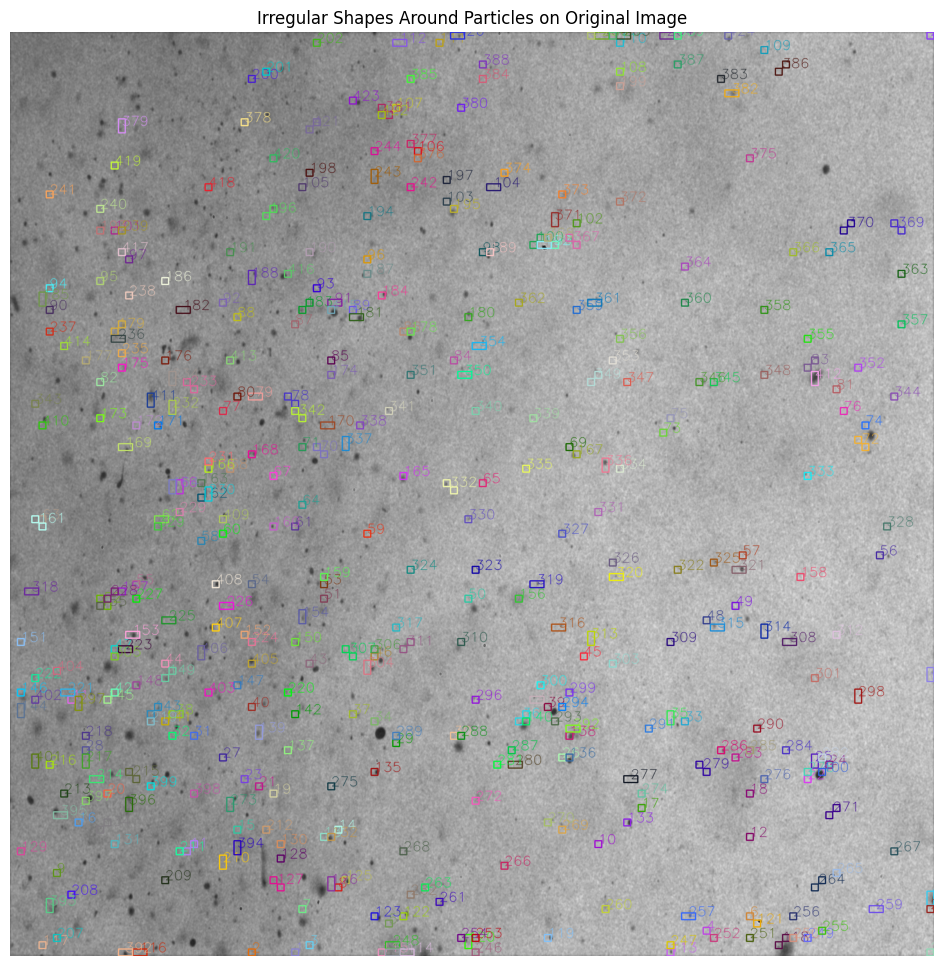

In [55]:
output_image = draw_irregular_shapes_on_original(
    original_image=sample_img,
    valid_contours=valid_contours
)

In [22]:
def refine_particle_detection(original_image, mask, min_area=10, max_area=500, intensity_threshold=50):
    """
    Refine particle detection by applying preprocessing and filtering.

    Args:
        original_image (np.ndarray): Grayscale image (H, W).
        mask (np.ndarray): Binary mask of regions of interest.
        min_area (int): Minimum area of a valid particle.
        max_area (int): Maximum area of a valid particle.
        intensity_threshold (float): Minimum mean intensity to retain a contour.

    Returns:
        None: Displays the refined particles overlaid on the original image.
    """
    # Preprocess the masked image
    adaptive_thresh = cv2.adaptiveThreshold(
        mask, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
    )
    kernel = np.ones((3, 3), np.uint8)
    processed_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_OPEN, kernel)

    # Find contours
    contours, _ = cv2.findContours(processed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours by area and intensity
    valid_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if min_area <= area <= max_area:
            # Calculate mean intensity
            mask = np.zeros_like(original_image, dtype=np.uint8)
            cv2.drawContours(mask, [contour], -1, 255, thickness=cv2.FILLED)
            mean_intensity = cv2.mean(original_image, mask=mask)[0]
            if mean_intensity > intensity_threshold:
                valid_contours.append(contour)

    # Draw valid contours on the original image
    image_colored = cv2.cvtColor((original_image * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
    cv2.drawContours(image_colored, valid_contours, -1, (0, 255, 0), thickness=2)

    # Visualize
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title("Refined Particle Detection")
    plt.axis("off")
    plt.show()

In [27]:
def refine_particle_detection_debug(original_image, mask, min_area=10, max_area=500, intensity_threshold=50):
    """
    Debug version of particle detection to identify where the process might fail.
    """
    # Preprocess the mask
    adaptive_thresh = cv2.adaptiveThreshold(
        mask, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
    )
    kernel = np.ones((3, 3), np.uint8)
    processed_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_OPEN, kernel)

    # Debug processed image
    plt.figure(figsize=(10, 10))
    plt.imshow(processed_image, cmap="gray")
    plt.title("Processed Image After Thresholding and Morphology")
    plt.axis("off")
    plt.show()

    # Find contours
    contours, _ = cv2.findContours(processed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Debug contours
    print(f"Total contours found: {len(contours)}")
    valid_contours = []
    for idx, contour in enumerate(contours):
        area = cv2.contourArea(contour)
        mask = np.zeros_like(original_image, dtype=np.uint8)
        cv2.drawContours(mask, [contour], -1, 255, thickness=cv2.FILLED)
        mean_intensity = cv2.mean(original_image, mask=mask)[0]
        print(f"Contour {idx + 1}: Area = {area}, Mean Intensity = {mean_intensity}")

        # Filter contours
        if min_area <= area <= max_area and mean_intensity > intensity_threshold:
            valid_contours.append(contour)

    # Draw valid contours
    image_colored = cv2.cvtColor((original_image * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
    cv2.drawContours(image_colored, valid_contours, -1, (0, 255, 0), thickness=2)

    # Visualize results
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title("Refined Particle Detection")
    plt.axis("off")
    plt.show()

    return valid_contours


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


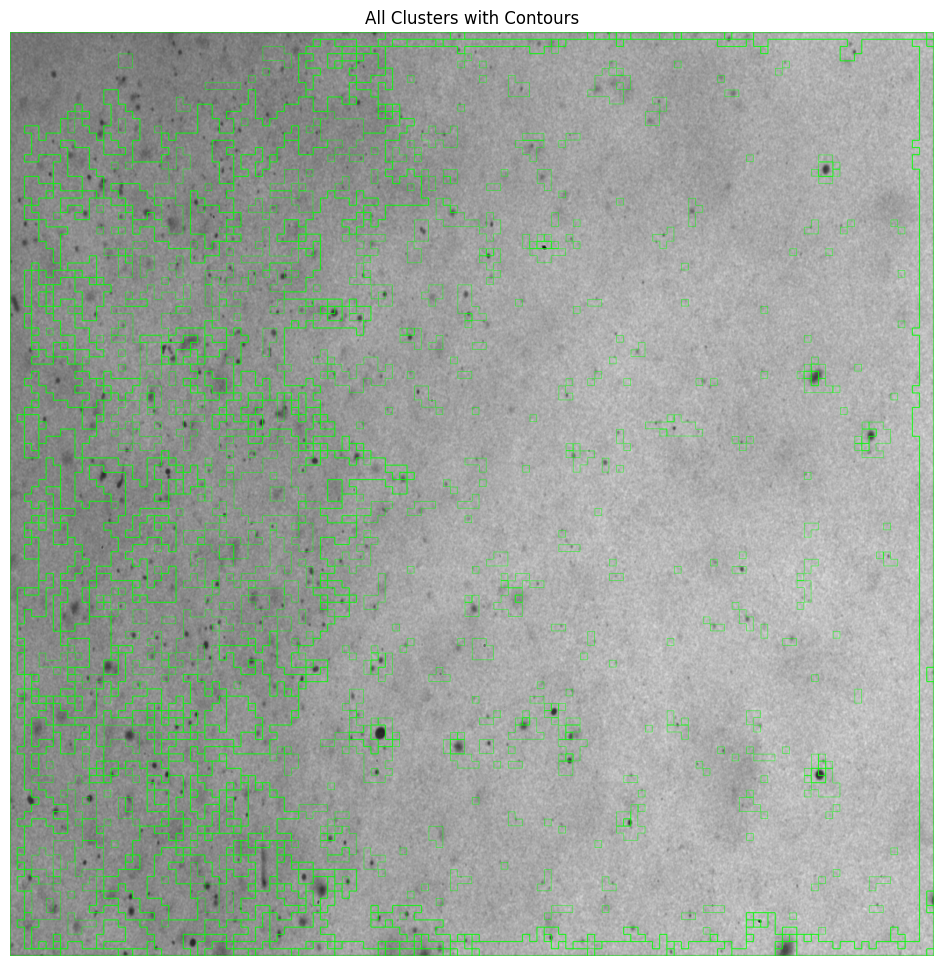

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


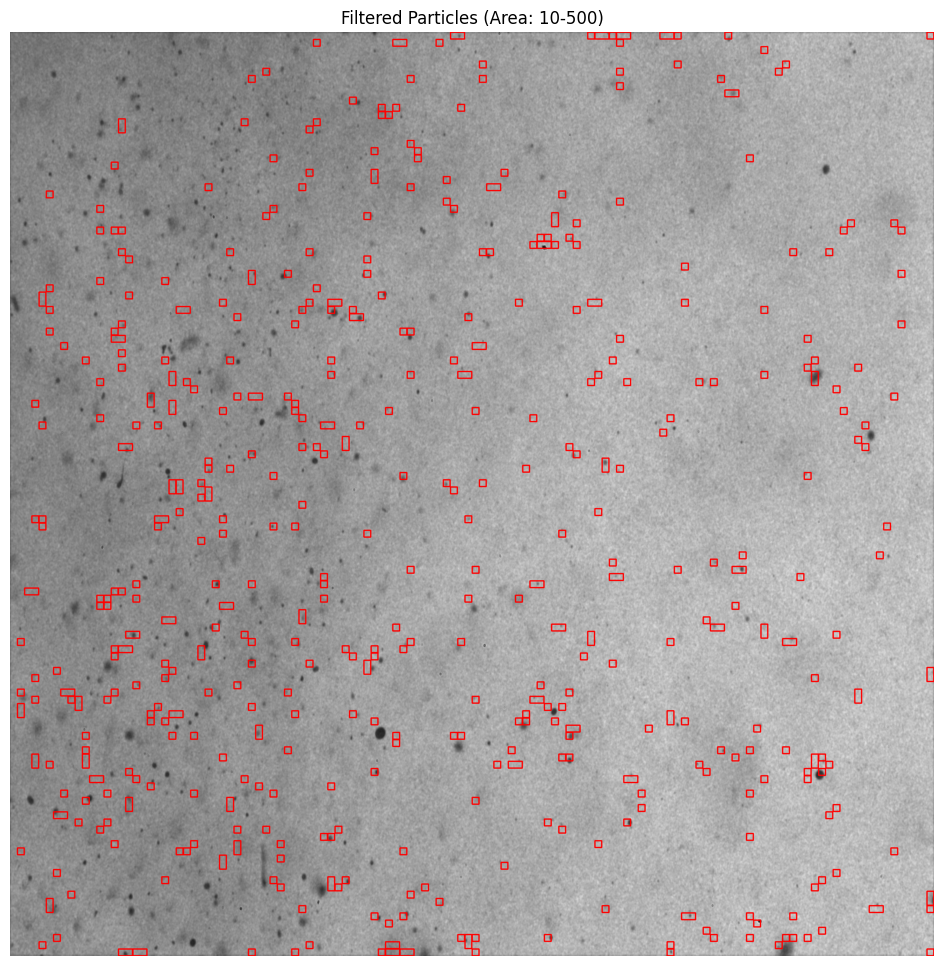

Total contours found: 687
Valid contours after filtering: 426


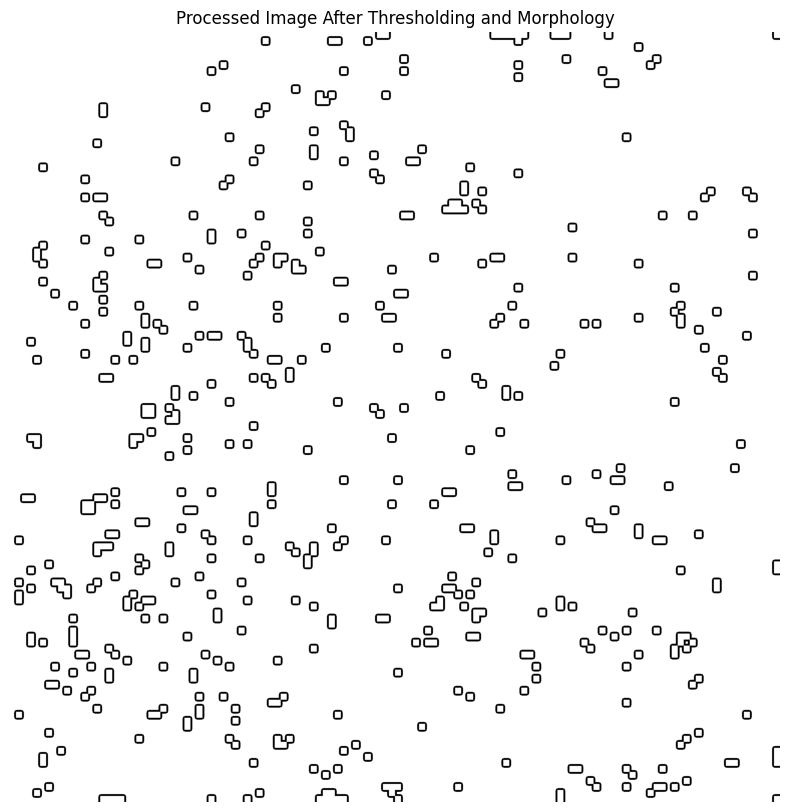

Total contours found: 15
Contour 1: Area = 225.0, Mean Intensity = 0.7329197463113815
Contour 2: Area = 225.0, Mean Intensity = 0.5872089705662802
Contour 3: Area = 225.0, Mean Intensity = 0.54502147086896
Contour 4: Area = 945.0, Mean Intensity = 0.534493742059567
Contour 5: Area = 465.0, Mean Intensity = 0.6998315118253231
Contour 6: Area = 1682.0, Mean Intensity = 0.5363795741993401
Contour 7: Area = 1171.0, Mean Intensity = 0.657352960924618
Contour 8: Area = 705.0, Mean Intensity = 0.6202767748618498
Contour 9: Area = 465.0, Mean Intensity = 0.7117340850527398
Contour 10: Area = 225.0, Mean Intensity = 0.6875766117591411
Contour 11: Area = 225.0, Mean Intensity = 0.5982690155506134
Contour 12: Area = 705.0, Mean Intensity = 0.6140982662327588
Contour 13: Area = 1666.0, Mean Intensity = 0.6235841430856713
Contour 14: Area = 465.0, Mean Intensity = 0.5779258808470331
Contour 15: Area = 4173580.0, Mean Intensity = 0.626249490291781


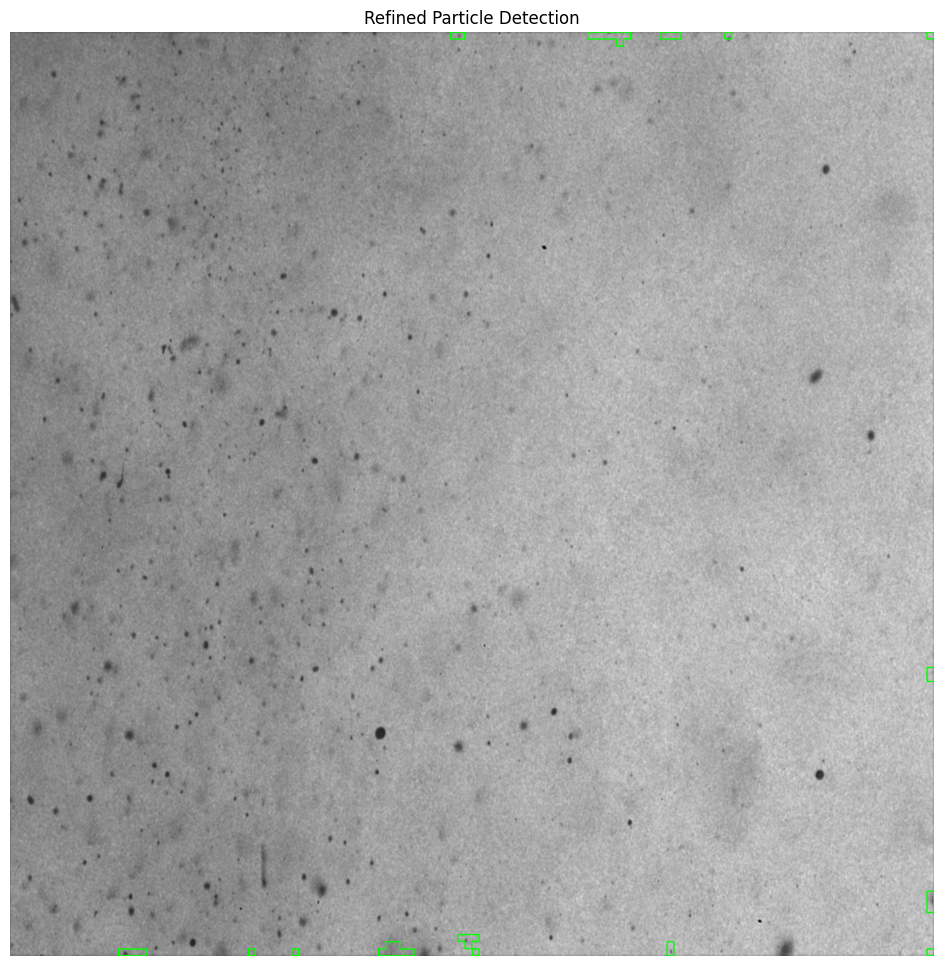

[array([[[2032, 2032]],
 
        [[2032, 2047]],
 
        [[2047, 2047]],
 
        [[2047, 2032]]], dtype=int32),
 array([[[ 624, 2032]],
 
        [[ 624, 2047]],
 
        [[ 639, 2047]],
 
        [[ 639, 2032]]], dtype=int32),
 array([[[ 528, 2032]],
 
        [[ 528, 2047]],
 
        [[ 543, 2047]],
 
        [[ 543, 2032]]], dtype=int32),
 array([[[ 240, 2032]],
 
        [[ 240, 2047]],
 
        [[ 303, 2047]],
 
        [[ 303, 2032]]], dtype=int32),
 array([[[1456, 2016]],
 
        [[1456, 2047]],
 
        [[1471, 2047]],
 
        [[1471, 2016]]], dtype=int32),
 array([[[ 832, 2016]],
 
        [[ 832, 2031]],
 
        [[ 831, 2032]],
 
        [[ 816, 2032]],
 
        [[ 816, 2047]],
 
        [[ 895, 2047]],
 
        [[ 895, 2032]],
 
        [[ 864, 2032]],
 
        [[ 863, 2031]],
 
        [[ 863, 2016]]], dtype=int32),
 array([[[ 992, 2000]],
 
        [[ 992, 2015]],
 
        [[1007, 2015]],
 
        [[1008, 2016]],
 
        [[1008, 2031]],
 
        [[10

In [34]:
# Step 1: Generate valid contours
valid_contours = display_all_clusters_and_filter_by_size(
    sample_img=sample_img,
    cluster_labels_grid=cluster_labels_grid,
    min_area=10,
    max_area=500
)

# Step 2: Create a mask using valid contours
mask, masked_image = mask_image_with_valid_contours(
    original_image=sample_img,
    valid_contours=valid_contours
)

# Step 3: Refine particle detection within the masked regions
refine_particle_detection_debug(
    original_image=sample_img[0, 0].cpu().numpy(),  # Grayscale original image
    mask=mask,                                      # Binary mask from valid contours
    min_area=224,                                    # Adjust as needed
    max_area=5000,                                   # Adjust as needed
    intensity_threshold=0.01                         # Adjust for background removal
)


In [42]:
def threshold_each_gmm_box_locally(sample_img, cluster_labels_grid, min_area=10, max_area=500):
    """
    Apply local thresholding to each bounding box generated from GMM clusters.

    Args:
        sample_img (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        min_area (int): Minimum area of a valid particle.
        max_area (int): Maximum area of a valid particle.

    Returns:
        None: Displays the final image with thresholded particles.
    """
    # Step 1: Convert image to NumPy
    image_np = sample_img[0, 0].cpu().numpy()  # Shape: [H, W]
    original_h, original_w = image_np.shape

    # Step 2: Resize cluster labels to match the original image
    cluster_labels_resized = cv2.resize(
        cluster_labels_grid[0],
        (original_w, original_h),
        interpolation=cv2.INTER_NEAREST,
    )

    # Step 3: Create a binary mask and find contours
    unique_clusters = np.unique(cluster_labels_resized)
    valid_contours = []
    for cluster_id in unique_clusters:
        mask = (cluster_labels_resized == cluster_id).astype(np.uint8)
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in contours:
            if min_area <= cv2.contourArea(contour) <= max_area:
                valid_contours.append(contour)

    # Step 4: Process each bounding box
    image_colored = cv2.cvtColor((image_np * 255).astype(np.uint8), cv2.COLOR_GRAY2BGR)
    for contour in valid_contours:
        # Get bounding box for the contour
        x, y, w, h = cv2.boundingRect(contour)

        # Extract the region of interest (ROI)
        roi = image_np[y:y+h, x:x+w]

        # Apply local adaptive thresholding
        roi_thresh = cv2.adaptiveThreshold(
            (roi * 255).astype(np.uint8), 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
        )

        # Overlay thresholded ROI back onto the original image
        image_colored[y:y+h, x:x+w, 0] = roi_thresh
        image_colored[y:y+h, x:x+w, 1] = roi_thresh
        image_colored[y:y+h, x:x+w, 2] = roi_thresh

    # Step 5: Visualize the result
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title("Local Thresholding Applied to GMM Boxes")
    plt.axis("off")
    plt.show()

    # Debugging: Print results
    print(f"Total clusters processed: {len(unique_clusters)}")
    print(f"Valid bounding boxes found: {len(valid_contours)}")
    return image_colored

In [83]:
def threshold_each_gmm_box_locally(sample_img, cluster_labels_grid, min_area=10, max_area=500):
    """
    Apply local thresholding to each bounding box generated from GMM clusters.

    Args:
        sample_img (torch.Tensor): Grayscale image tensor, shape [1, 1, H, W].
        cluster_labels_grid (np.ndarray): Cluster labels grid, shape [B, H, W].
        min_area (int): Minimum area of a valid particle.
        max_area (int): Maximum area of a valid particle.

    Returns:
        np.ndarray: Binary image with thresholded particles (shape [H, W]).
    """
    # Step 1: Convert image to NumPy
    image_np = sample_img[0, 0].cpu().numpy()  # Shape: [H, W]
    original_h, original_w = image_np.shape

    # Step 2: Resize cluster labels to match the original image
    cluster_labels_resized = cv2.resize(
        cluster_labels_grid[0],
        (original_w, original_h),
        interpolation=cv2.INTER_NEAREST,
    )

    # Step 3: Create a binary mask and find contours
    unique_clusters = np.unique(cluster_labels_resized)
    valid_contours = []
    for cluster_id in unique_clusters:
        mask = (cluster_labels_resized == cluster_id).astype(np.uint8)
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in contours:
            if min_area <= cv2.contourArea(contour) <= max_area:
                valid_contours.append(contour)

    # Step 4: Create a blank binary image for the final result
    binary_result = np.zeros_like(image_np, dtype=np.uint8)

    # Step 5: Process each bounding box
    for contour in valid_contours:
        # Get bounding box for the contour
        x, y, w, h = cv2.boundingRect(contour)

        # Extract the region of interest (ROI)
        roi = image_np[y:y+h, x:x+w]

        # Apply local adaptive thresholding
        roi_thresh = cv2.adaptiveThreshold(
            (roi * 255).astype(np.uint8), 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
        )

        # Overlay thresholded ROI back onto the binary result
        binary_result[y:y+h, x:x+w] = roi_thresh

    # Step 6: Visualize the binary result
    plt.figure(figsize=(12, 12))
    plt.imshow(binary_result, cmap="gray")
    plt.title("Binary Image with Local Thresholding Applied")
    plt.axis("off")
    plt.show()

    # Debugging: Print results
    print(f"Total clusters processed: {len(unique_clusters)}")
    print(f"Valid bounding boxes found: {len(valid_contours)}")
    
    return binary_result


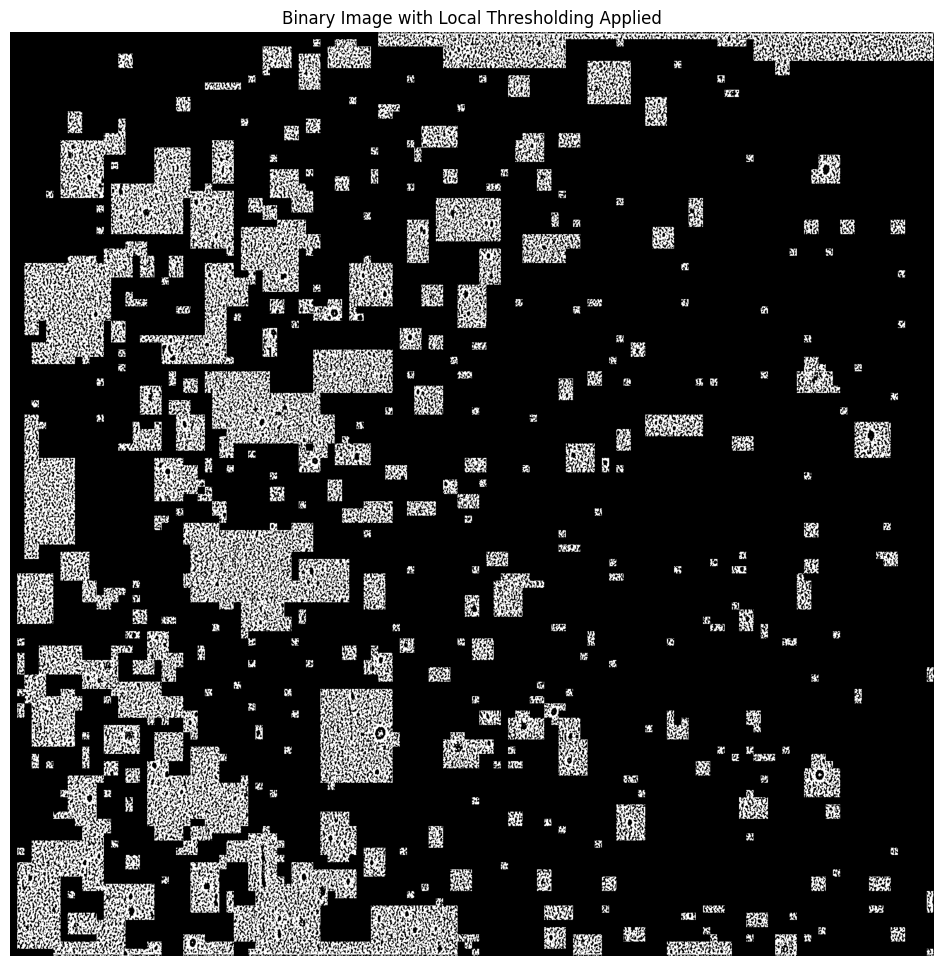

Total clusters processed: 5
Valid bounding boxes found: 671


In [84]:
altered_image =threshold_each_gmm_box_locally(
    sample_img=sample_img,
    cluster_labels_grid=cluster_labels_grid,
    min_area=10,
    max_area=9000
)

In [85]:
def circle_particles_on_altered_image(altered_image, original_image, min_area, max_area):
    """
    Detect and circle particles in the altered image.

    Args:
        altered_image (np.ndarray): Altered image with highlighted particles, shape [H, W].
        original_image (torch.Tensor): Original image tensor, shape [B, C, H, W].
        min_area (float): Minimum contour area to consider as a valid particle.
        max_area (float): Maximum contour area to consider as a valid particle.

    Returns:
        None: Displays the original image with particles circled.
    """
    # Step 1: Ensure altered_image is grayscale
    if altered_image.ndim == 3:  # If it has 3 channels, convert to grayscale
        altered_image = cv2.cvtColor(altered_image, cv2.COLOR_BGR2GRAY)

    # Step 2: Scale altered_image to 0–255 and convert to uint8
    altered_image_uint8 = (altered_image * 255).astype(np.uint8)

    # Step 3: Find contours in the altered image
    contours, _ = cv2.findContours(altered_image_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Step 4: Filter contours by size
    valid_contours = [c for c in contours if min_area <= cv2.contourArea(c) <= max_area]

    # Step 5: Convert original_image from Tensor to NumPy
    single_image = original_image[0]  # Select the first image in the batch
    original_image_np = single_image.permute(1, 2, 0).cpu().numpy()  # Shape: [H, W, C]
    original_image_np = (original_image_np * 255).astype(np.uint8)  # Scale to 0–255

    # Step 6: Print debugging information for contours
    print("Debugging Contours Information:")
    for i, contour in enumerate(valid_contours):
        # Get the center and radius of the minimum enclosing circle
        (x, y), radius = cv2.minEnclosingCircle(contour)
        print(f"Contour {i + 1}: Center=({x:.2f}, {y:.2f}), Radius={radius:.2f}, Area={cv2.contourArea(contour):.2f}")

    # Step 7: Draw circles around valid particles
    image_colored = original_image_np.copy()  # No need for cv2.cvtColor
    for contour in valid_contours:
        # Get the center and radius of the minimum enclosing circle
        (x, y), radius = cv2.minEnclosingCircle(contour)
        center = (int(x), int(y))
        radius = int(radius)
        cv2.circle(image_colored, center, radius, (0, 255, 0), thickness=2)

    # Step 8: Visualize the result
    plt.figure(figsize=(12, 12))
    plt.imshow(image_colored)
    plt.title("Particles Circled on Original Image")
    plt.axis("off")
    plt.show()

    # Debugging: Print the results
    print(f"Total contours found: {len(contours)}")
    print(f"Valid particles circled: {len(valid_contours)}")



Debugging Contours Information:
Contour 1: Center=(2044.00, 2046.50), Radius=3.04, Area=1.50
Contour 2: Center=(1716.50, 2047.00), Radius=1.50, Area=1.00
Contour 3: Center=(1701.50, 2046.50), Radius=3.54, Area=1.50
Contour 4: Center=(1555.00, 2046.50), Radius=1.12, Area=1.00
Contour 5: Center=(1547.00, 2046.50), Radius=1.12, Area=1.50
Contour 6: Center=(1533.50, 2046.50), Radius=0.71, Area=0.50
Contour 7: Center=(1502.00, 2046.50), Radius=1.12, Area=1.50
Contour 8: Center=(1495.00, 2047.00), Radius=2.00, Area=1.00
Contour 9: Center=(1487.00, 2046.50), Radius=2.06, Area=3.00
Contour 10: Center=(1475.00, 2046.50), Radius=2.06, Area=1.00
Contour 11: Center=(1299.50, 2046.50), Radius=1.58, Area=2.50
Contour 12: Center=(1291.50, 2046.50), Radius=0.71, Area=0.50
Contour 13: Center=(1259.50, 2047.00), Radius=1.50, Area=2.00
Contour 14: Center=(1028.00, 2047.00), Radius=2.00, Area=1.00
Contour 15: Center=(988.50, 2046.50), Radius=2.55, Area=2.50
Contour 16: Center=(980.00, 2047.00), Radius=3.0

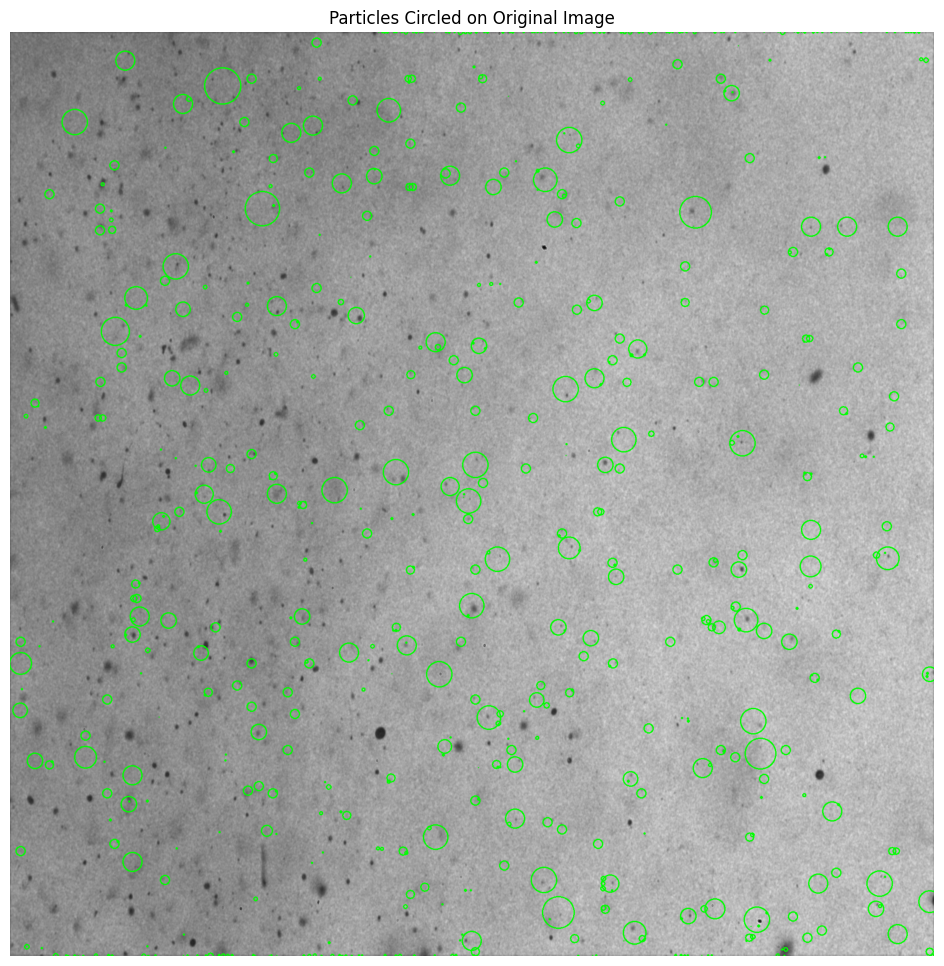

Total contours found: 1193
Valid particles circled: 628


In [88]:
circle_particles_on_altered_image(altered_image, sample_img, min_area=0.1, max_area=1500)

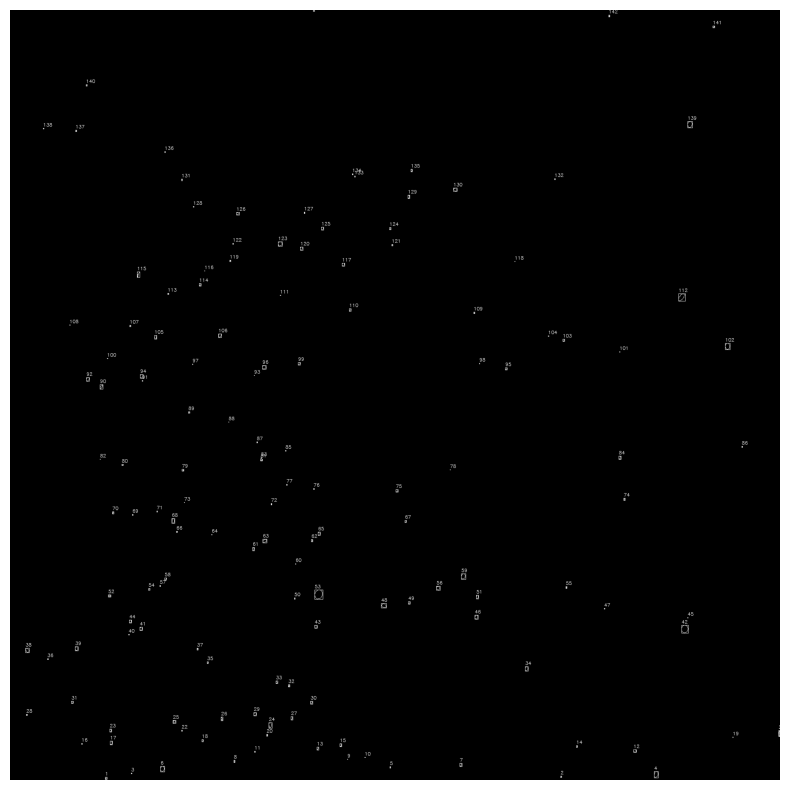

Sample_img
Number of particles: 143
Particle sizes: [12.5, 4.0, 0.5, 122.5, 2.5, 104.0, 33.0, 9.5, 0.0, 0.0, 1.0, 36.5, 18.0, 6.0, 23.0, 1.0, 41.0, 10.0, 0.0, 7.0, 25.5, 2.0, 22.0, 72.5, 31.0, 22.5, 26.5, 2.5, 36.5, 21.0, 17.0, 10.5, 15.5, 59.5, 7.0, 1.5, 5.5, 66.0, 58.5, 0.5, 38.5, 263.5, 36.0, 28.5, 0.0, 58.5, 0.5, 89.5, 21.0, 2.5, 34.5, 16.0, 375.0, 8.0, 6.0, 61.0, 1.5, 15.5, 111.5, 0.0, 22.5, 11.0, 55.5, 0.0, 32.5, 3.5, 11.5, 60.5, 1.0, 7.5, 1.5, 2.0, 0.0, 7.5, 20.5, 2.0, 1.5, 0.0, 14.0, 5.0, 14.5, 0.0, 0.0, 33.0, 1.0, 2.0, 1.5, 0.0, 5.0, 35.0, 1.0, 50.0, 0.0, 49.0, 18.0, 66.5, 0.0, 0.0, 25.0, 0.0, 0.0, 146.0, 16.0, 0.5, 33.5, 46.0, 4.0, 0.0, 4.5, 16.0, 0.0, 179.0, 4.0, 17.0, 35.0, 0.0, 36.0, 0.0, 3.0, 33.5, 5.0, 1.5, 87.5, 11.0, 29.5, 29.0, 2.5, 0.5, 27.0, 51.0, 2.0, 1.5, 0.5, 1.5, 13.0, 1.5, 5.0, 1.0, 142.5, 3.0, 11.0, 6.5, 2.5]



In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

threshold = 0.275

binary_mask = (error_map_image > threshold).astype(np.uint8)

contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

contour_image = np.zeros_like(error_map_image, dtype=np.uint8)

particle_count = 0
for i, contour in enumerate(contours):
    cv2.drawContours(contour_image, [contour], -1, (255), 1)  # Draw white contours

    # Optionally, draw bounding boxes
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(contour_image, (x, y), (x + w, y + h), (255), 1)

    # Label each particle with a number
    cv2.putText(contour_image, f"{i + 1}", (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255), 1)

    particle_count += 1

# Plot the results
plt.figure(figsize=(10, 10))
plt.imshow(contour_image, cmap="gray")
plt.axis("off")
plt.show()

particle_sizes = []
for contour in contours:
    area = cv2.contourArea(contour)
    particle_sizes.append(area)

print(f"Sample_img")
print(f"Number of particles: {len(contours)}")
print(f"Particle sizes: {particle_sizes}\n")